# Análise dos resultados de teste por similaridade

Run de teste `f8009a56a83b`. Este notebook só lê resultados existentes; não chama modelos.

1. Configuração e dados disponíveis
2. Auditoria das falhas e marcações
3. Acurácia no conjunto experimental completo
4. Acurácia com filtros de qualidade
5. Acurácia por faixas de similaridade
6. Thresholds: acurácia por dataset e médias macro/micro
7. Escolha do threshold na validação e aplicação ao teste
8. Exportação e interpretação

Execute de cima para baixo. As tabelas e figuras ficam em uma pasta identificada pela configuração, sem alterar os resultados originais.

Os eixos Y se ajustam aos dados, com margem configurável no início. Compare os valores e as marcações do eixo: as barras podem começar acima de zero. No teste, as vistas completa e filtrada compartilham os limites por modelo/dataset e tipo de gráfico.

In [1]:
# CONTROLE PRINCIPAL: também vale para validação e todos os thresholds.
USE_BASELINE_ON_FAILURE = True

TEST_EXPERIMENT_ID = "f8009a56a83b"
VALIDATION_EXPERIMENT_ID = "91ccab5e5028"  # None desativa seleção pela validação
RESTORE_TEST_HANDOFF = True  # restaura pacote local verificado se necessário; sem download
N_SIMILARITY_BINS = 10
THRESHOLDS = [-1.0] + [round(i / 20, 2) for i in range(21)]
# -1 aceita todas as similaridades cosseno finitas; decisão: similaridade >= threshold.
VALIDATION_MIN_N = 30
VALIDATION_MIN_COVERAGE = 0.0
RACE_SUBSETS = []  # [] = todos; ou ["middle"] / ["high"]
SAVE_PDF = True

# A seção filtrada rejeita estas marcações. Ajuste antes de executar novamente.
CLEAN_EXCLUDE_FLAGS = [
    "length_exhausted", "empty_exhausted", "context_exceeded", "content_filter",
    "partial_think", "reflection_clipped_for_context", "embedding_truncated",
]
# thinking_removed, judge_fallback e budget_reduced_for_context são informativas:
# não são excluídas por padrão. Podem ser acrescentadas à lista acima.

# Eixo Y: ajuste automático por dataset; margem em pontos de acurácia.
AUTO_YLIM = True  # False restaura 0–100%
YLIM_PADDING = 0.04
YLIM_MIN_SPAN = 0.12


## 1. Dados e regras de cálculo

- **True:** toda questão do universo de baseline continua no denominador. Se a condição não tiver resposta utilizável, for rejeitada pelo filtro ou ficar abaixo do threshold, usamos seu baseline. Se o baseline também falhar, a questão conta como erro e aparece em `n_unanswered`.
- **False:** usamos somente respostas utilizáveis que passaram o threshold/filtro. Não fazemos interseção entre condições; os tamanhos podem diferir. O baseline mostra suas próprias respostas resolvidas.
- Resposta errada e resolvida não dispara fallback. A decisão nunca depende do gabarito.
- O baseline não é filtrado por similaridade nem pelas marcações opcionais: é a referência fixa. Não são criadas condições que nunca foram executadas. Linhas ausentes de uma condição existente são tratadas como falha.
- A análise completa preserva respostas válidas com marcações informativas; a análise filtrada trata as marcações selecionadas como motivo para rejeitar a resposta experimental. Com fallback ligado, a seção filtrada também preserva o universo completo; desligado, usa apenas os casos aceitos.
- Acurácia = acertos / `n`; cobertura = `n` / `n_total`. `n_reflection` mede o uso efetivo de reflexões e `n_fallback` mede substituições pelo baseline.

In [2]:
from pathlib import Path
import hashlib
import json
import math
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from IPython.display import display

ROOT = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "run_experiment.py").exists())
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))
from rmcq.test_analysis import (
    GROUP, CONDITIONS, load_run, build_panel, apply_policy, summarize_policy,
    threshold_sweep, average_datasets, select_validation_thresholds, transfer_thresholds,
)
plt.style.use("seaborn-v0_8-whitegrid")
LABELS = {"baseline": "Baseline", "self_simple": "Autorreflexão simples",
          "self_complex": "Autorreflexão complexa", "teacher_simple": "Teacher simples",
          "teacher_complex": "Teacher complexa"}
COLORS = dict(zip(CONDITIONS, ["#222222", "#1f77b4", "#17becf", "#d62728", "#ff7f0e"]))
CONFIG = dict(test=TEST_EXPERIMENT_ID, validation=VALIDATION_EXPERIMENT_ID,
              fallback=USE_BASELINE_ON_FAILURE, clean_exclude_flags=CLEAN_EXCLUDE_FLAGS,
              thresholds=THRESHOLDS, validation_min_n=VALIDATION_MIN_N,
              validation_min_coverage=VALIDATION_MIN_COVERAGE, race_subsets=RACE_SUBSETS,
              bins=N_SIMILARITY_BINS)
CONFIG_ID = hashlib.sha256(json.dumps(CONFIG, sort_keys=True).encode()).hexdigest()[:10]
OUT = ROOT / "data/results/reflection_top1" / TEST_EXPERIMENT_ID / "analysis" / f"test_notebook_{CONFIG_ID}"
OUT.mkdir(parents=True, exist_ok=True)
(OUT / "config.json").write_text(json.dumps(CONFIG, indent=2, ensure_ascii=False), encoding="utf-8")

test, test_sources = load_run(ROOT, TEST_EXPERIMENT_ID, "test", RESTORE_TEST_HANDOFF)
if test.empty:
    raise FileNotFoundError("Não encontrei os resultados de teste nem seu pacote finish local.")
validation, validation_sources = (load_run(ROOT, VALIDATION_EXPERIMENT_ID, "validation")
    if VALIDATION_EXPERIMENT_ID else (pd.DataFrame(), []))
if RACE_SUBSETS:
    test = test.loc[test.dataset.ne("race") | test.race_subset.isin(RACE_SUBSETS)].copy()
    if not validation.empty:
        validation = validation.loc[validation.dataset.ne("race") | validation.race_subset.isin(RACE_SUBSETS)].copy()
if test.empty:
    raise ValueError("Nenhum resultado passou pelo recorte de datasets.")
(OUT / "sources.json").write_text(json.dumps(dict(test=test_sources, validation=validation_sources), indent=2), encoding="utf-8")
print(f"Teste: {len(test):,} linhas; {test.model.nunique()} modelos; {test.dataset.nunique()} datasets.")
print(f"Validação disponível: {len(validation):,} linhas. Saída: {OUT}")
coverage_input = test.groupby(GROUP).size().rename("linhas_originais").reset_index()
display(coverage_input.pivot_table(index=["model", "dataset"], columns="condition", values="linhas_originais"))
if not validation.empty:
    display(validation.groupby(GROUP).size().rename("linhas_validação").reset_index())

Teste: 277,101 linhas; 7 modelos; 5 datasets.
Validação disponível: 7,800 linhas. Saída: C:\Users\rodri\OneDrive\Documentos\GitHub\AIIMS\papers\Reflection-MCQ\data\results\reflection_top1\f8009a56a83b\analysis\test_notebook_c9a87f7345


condition                                baseline  self_complex  self_simple  \
model                        dataset                                           
deepseek-r1-distill-llama-8b aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   
gpt-5-4-petrobras            aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   
llama3.1-8b                  aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   
mistral-7b-instruct          aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   
phi2                         aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   
phi4-mini                    aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   
qwen3-8b                     aqua           246.0         246.0        246.0   
                             arc           1169.0        1169.0       1169.0   
                             logiqa2       1550.0        1550.0       1550.0   
                             openbookqa     498.0         498.0        498.0   
                             race          4934.0        4934.0       4934.0   

condition                                teacher_complex  teacher_simple  
model                        dataset                                      
deepseek-r1-distill-llama-8b aqua                  246.0           246.0  
                             arc                  1169.0          1169.0  
                             logiqa2              1550.0          1550.0  
                             openbookqa            498.0           498.0  
                             race                 4934.0          4934.0  
gpt-5-4-petrobras            aqua                    NaN             NaN  
                             arc                     NaN             NaN  
                             logiqa2                 NaN             NaN  
                             openbookqa              NaN             NaN  
                             race                    NaN             NaN  
llama3.1-8b                  aqua                  246.0           246.0  
                             arc                  1169.0        

,model,dataset,condition,linhas_validação
0,gpt-5-4-petrobras,aqua,baseline,252
1,gpt-5-4-petrobras,aqua,self_complex,252
2,gpt-5-4-petrobras,aqua,self_simple,252
3,gpt-5-4-petrobras,arc,baseline,298
4,gpt-5-4-petrobras,arc,self_complex,298
5,gpt-5-4-petrobras,arc,self_simple,298
6,gpt-5-4-petrobras,logiqa2,baseline,1551
7,gpt-5-4-petrobras,logiqa2,self_complex,1551
8,gpt-5-4-petrobras,logiqa2,self_simple,1551
9,gpt-5-4-petrobras,openbookqa,baseline,499


## 2. Auditoria das falhas e marcações

As marcações podem se sobrepor; suas contagens não devem ser somadas como questões distintas. `judge_fallback` significa uso do avaliador para interpretar a resposta, não substituição pelo baseline. Resultados antigos podem não ter toda a auditoria detalhada disponível; a tabela informa essa cobertura.

,n
audit_flags,
judge_fallback,49714
thinking_removed,39282
embedding_truncated,25212
unresolved,21356
length_exhausted,18726
context_exceeded,1703
empty_exhausted,731
content_filter,187
budget_reduced_for_context,34


n  falhas  \
model                        dataset condition                       
deepseek-r1-distill-llama-8b aqua    baseline          246      30   
                                     self_complex      246      65   
                                     self_simple       246      57   
                                     teacher_complex   246      54   
                                     teacher_simple    246      59   
...                                                    ...     ...   
qwen3-8b                     race    baseline         4934       0   
                                     self_complex     4934       1   
                                     self_simple      4934       0   
                                     teacher_complex  4934       0   
                                     teacher_simple   4934       0   

                                                      auditoria_detalhada  
model                        dataset condition                             
deepseek-r1-distill-llama-8b aqua    baseline                         1.0  
                                     self_complex                     1.0  
                                     self_simple                      1.0  
                                     teacher_complex                  1.0  
                                     teacher_simple                   1.0  
...                                                                   ...  
qwen3-8b                     race    baseline                         1.0  
                                     self_complex                     1.0  
                                     self_simple                      1.0  
                                     teacher_complex                  1.0  
                                     teacher_simple                   1.0  

[165 rows x 3 columns]

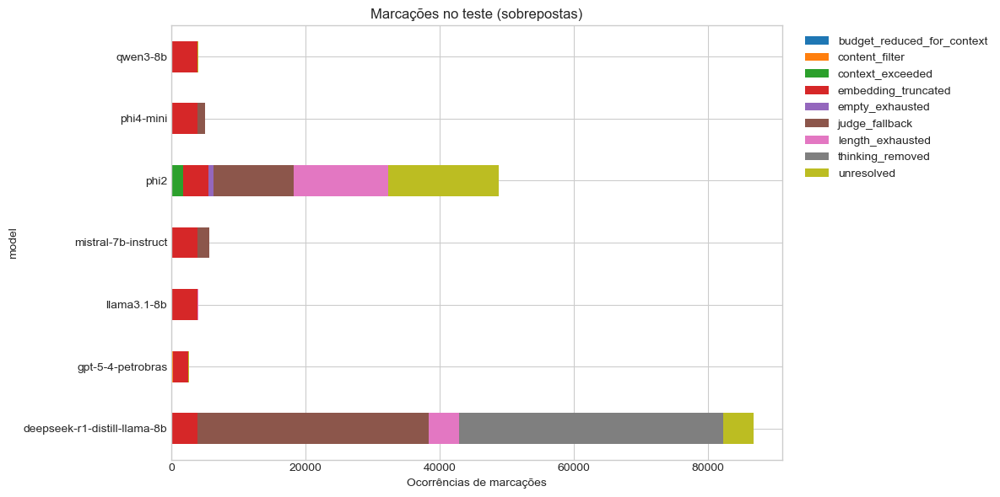

In [3]:
audit = test[["model", "dataset", "condition", "audit_flags"]].explode("audit_flags").dropna(subset=["audit_flags"])
audit_counts = audit.groupby([*GROUP, "audit_flags"]).size().rename("n").reset_index()
audit_counts.to_csv(OUT / "audit_flags.csv", index=False)
display(audit_counts.groupby("audit_flags")["n"].sum().sort_values(ascending=False).to_frame())
display(test.groupby(GROUP).agg(n=("failure", "size"), falhas=("failure", "sum"),
                               auditoria_detalhada=("audit_detail_available", "mean")))
if not audit_counts.empty:
    ax = audit_counts.groupby(["model", "audit_flags"])["n"].sum().unstack(fill_value=0).plot.barh(
        figsize=(12, 6), stacked=True, title="Marcações no teste (sobrepostas)")
    ax.set_xlabel("Ocorrências de marcações")
    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.savefig(OUT / "audit_flags.png", dpi=140, bbox_inches="tight")
    plt.show()
    plt.close()

In [4]:
from rmcq.plotting import accuracy_ylim

def show_metrics(table):
    numeric = {c: "{:.2%}" for c in table if "accuracy" in c or c in ["coverage", "fallback_rate", "delta_vs_matched_baseline"]}
    display(table.style.format(numeric, na_rep="—"))

def save_figure(fig, name):
    fig.savefig(OUT / f"{name}.png", dpi=140, bbox_inches="tight")
    if SAVE_PDF:
        fig.savefig(OUT / f"{name}.pdf", bbox_inches="tight")
    plt.show()
    plt.close(fig)

def plot_by_dataset(table, tag, x=None, limit_table=None):
    limit_table = table if limit_table is None else limit_table
    for model, model_rows in table.groupby("model", sort=True):
        datasets = list(model_rows.dataset.unique())
        fig, axes = plt.subplots(math.ceil(len(datasets) / 2), 2, figsize=(13, 4 * math.ceil(len(datasets) / 2)), squeeze=False)
        for ax, dataset in zip(axes.flat, datasets):
            part = model_rows.loc[model_rows.dataset.eq(dataset)]
            if x is None:
                part = part.set_index("condition").reindex([c for c in CONDITIONS if c in set(part.condition)])
                ax.bar(range(len(part)), part.accuracy, color=[COLORS[c] for c in part.index])
                ax.set_xticks(range(len(part)), [LABELS[c] for c in part.index], rotation=22, ha="right")
                for i, row in enumerate(part.itertuples()):
                    if pd.notna(row.accuracy):
                        inside = AUTO_YLIM and row.accuracy > .94
                        ax.text(i, row.accuracy - .008 if inside else row.accuracy + .01,
                                f"{row.accuracy:.1%}\nn={row.n:,}", ha="center", fontsize=8,
                                va="top" if inside else "bottom", color="white" if inside else "black")
            else:
                for condition in CONDITIONS:
                    curve = part.loc[part.condition.eq(condition)].sort_values(x)
                    if curve.empty:
                        continue
                    ax.plot(curve[x], curve.accuracy, marker="o", ms=3, label=LABELS[condition], color=COLORS[condition])
                ax.set_xlabel("Similaridade média da faixa" if x == "similarity_mean" else "Threshold mínimo de similaridade")
                if x == "threshold":
                    ax.set_xlim(0, 1)  # -1 (sem corte) permanece nas tabelas
                ax.legend(fontsize=8)
            ax.set_title(dataset)
            limit_rows = limit_table.loc[limit_table.model.eq(model) & limit_table.dataset.eq(dataset)]
            if x == "threshold":
                limit_rows = limit_rows.loc[limit_rows.threshold.ge(0)]
            limits = accuracy_ylim(limit_rows.accuracy, padding=YLIM_PADDING,
                                   min_span=YLIM_MIN_SPAN, annotations=x is None) if AUTO_YLIM else (0, 1.12 if x is None else 1)
            ax.set_ylim(*limits)
            ax.yaxis.set_major_formatter(PercentFormatter(1))
            ax.set_ylabel("Acurácia")
        for ax in list(axes.flat)[len(datasets):]:
            ax.set_visible(False)
        fig.suptitle(f"{model} | {tag} | fallback={USE_BASELINE_ON_FAILURE}", y=1.01)
        fig.tight_layout()
        save_figure(fig, f"{tag}_{model}")

panels = {"completo": build_panel(test), "filtrado": build_panel(test, CLEAN_EXCLUDE_FLAGS)}
policies = {view: apply_policy(panel, None, USE_BASELINE_ON_FAILURE) for view, panel in panels.items()}
summaries = {view: summarize_policy(rows) for view, rows in policies.items()}
summary_limits = pd.concat(summaries.values(), ignore_index=True)


## 3. Conjunto experimental completo, sem corte de similaridade

Aplica somente a regra principal de disponibilidade/fallback. `n_total` é o universo original de questões de cada modelo e dataset. No modo sem fallback, o gráfico deixa de representar o universo completo; os valores de `n` mostram o recorte efetivamente avaliado.

,model,dataset,condition,n_total,n,correct,n_reflection,n_fallback,n_unanswered,n_below_threshold,accuracy,coverage,fallback_rate
0,deepseek-r1-distill-llama-8b,aqua,baseline,246,246,206.000000,0,0,30,0,83.74%,100.00%,0.00%
1,deepseek-r1-distill-llama-8b,aqua,self_complex,246,246,211.000000,181,65,19,0,85.77%,100.00%,26.42%
2,deepseek-r1-distill-llama-8b,aqua,self_simple,246,246,214.000000,189,57,17,0,86.99%,100.00%,23.17%
3,deepseek-r1-distill-llama-8b,aqua,teacher_complex,246,246,209.000000,192,54,19,0,84.96%,100.00%,21.95%
4,deepseek-r1-distill-llama-8b,aqua,teacher_simple,246,246,209.000000,187,59,18,0,84.96%,100.00%,23.98%
5,deepseek-r1-distill-llama-8b,arc,baseline,1169,1169,1047.000000,0,0,17,0,89.56%,100.00%,0.00%
6,deepseek-r1-distill-llama-8b,arc,self_complex,1169,1169,1057.000000,1118,51,1,0,90.42%,100.00%,4.36%
7,deepseek-r1-distill-llama-8b,arc,self_simple,1169,1169,1048.000000,1108,61,2,0,89.65%,100.00%,5.22%
8,deepseek-r1-distill-llama-8b,arc,teacher_complex,1169,1169,1062.000000,1118,51,2,0,90.85%,100.00%,4.36%
9,deepseek-r1-distill-llama-8b,arc,teacher_simple,1169,1169,1048.000000,1110,59,3,0,89.65%,100.00%,5.05%


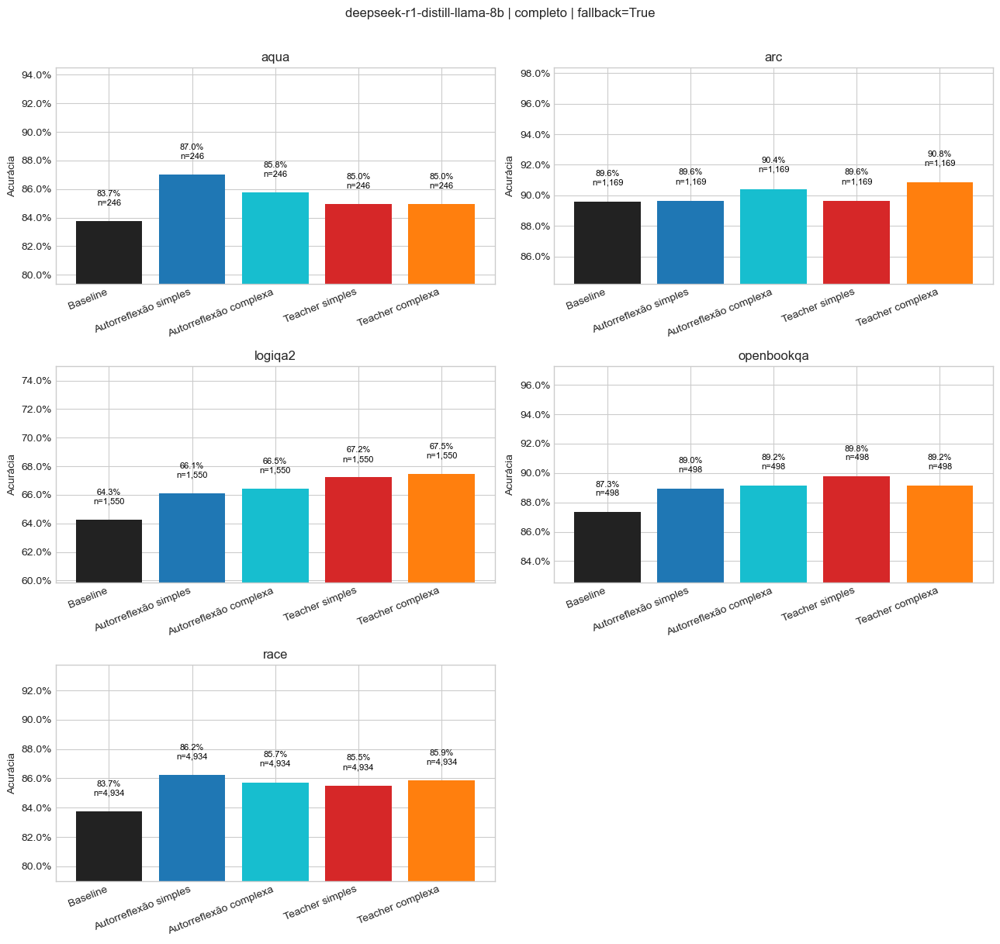

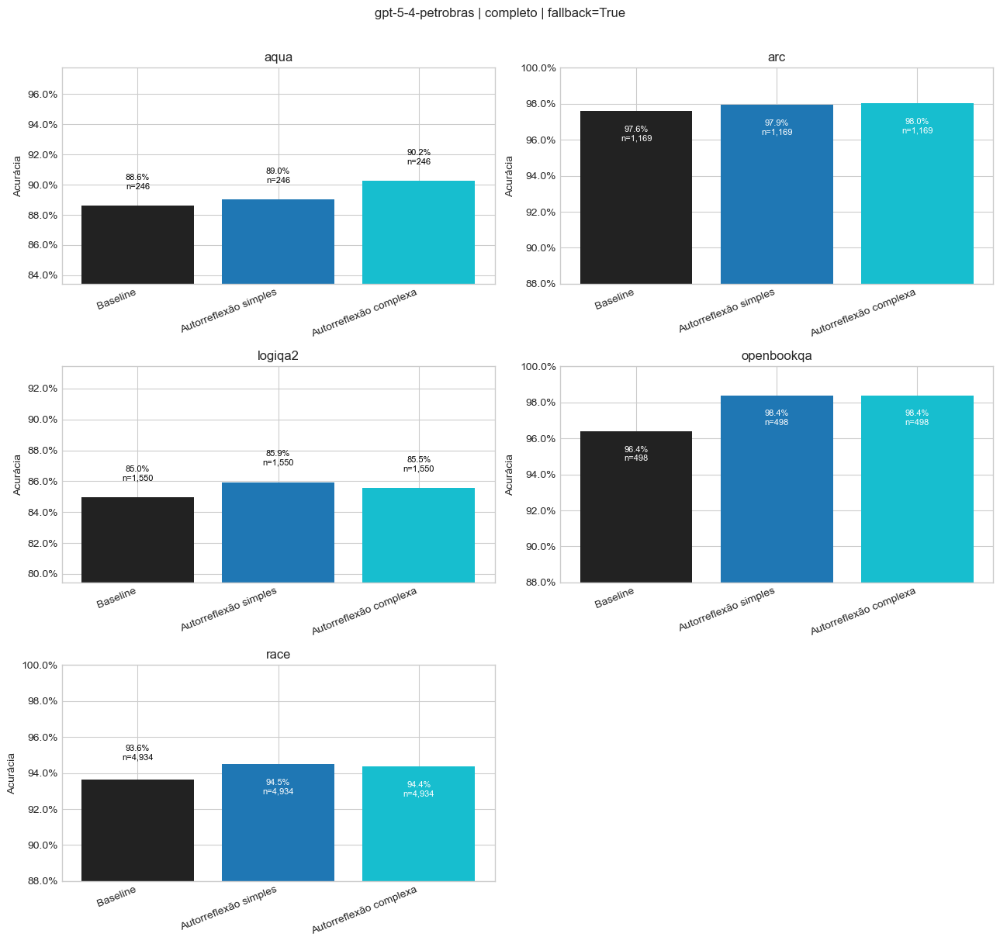

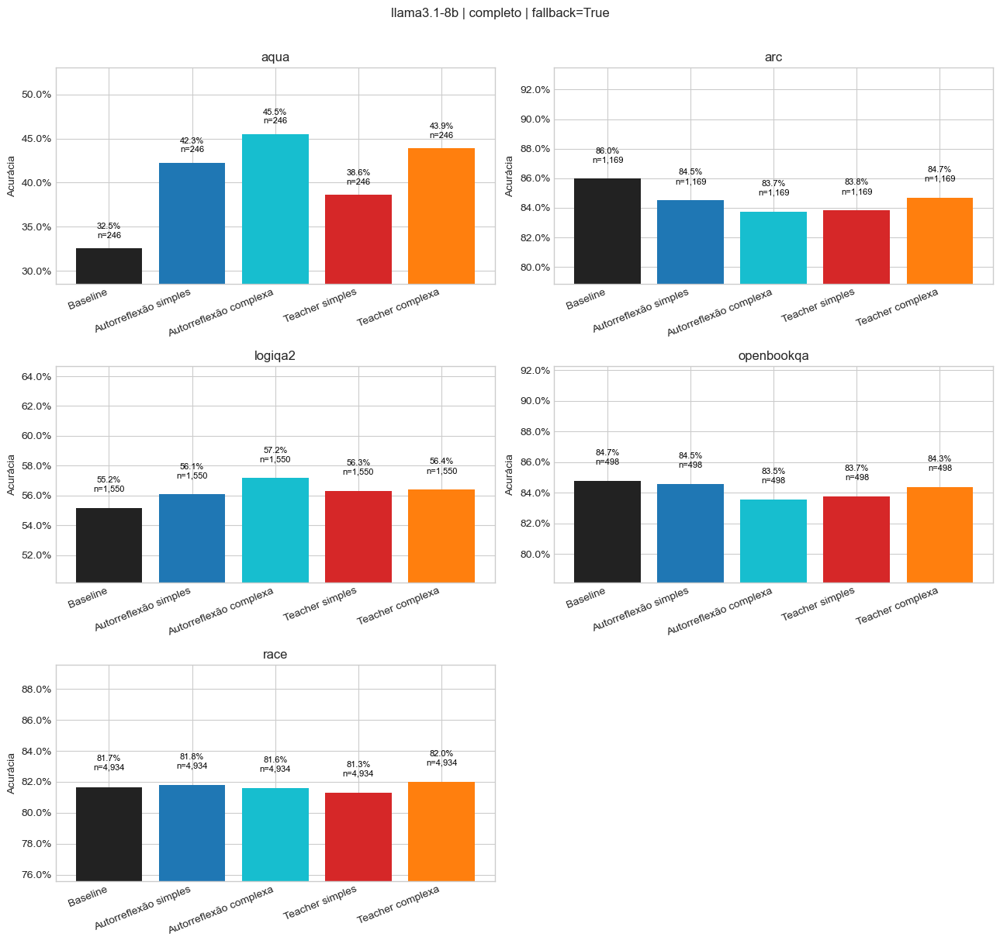

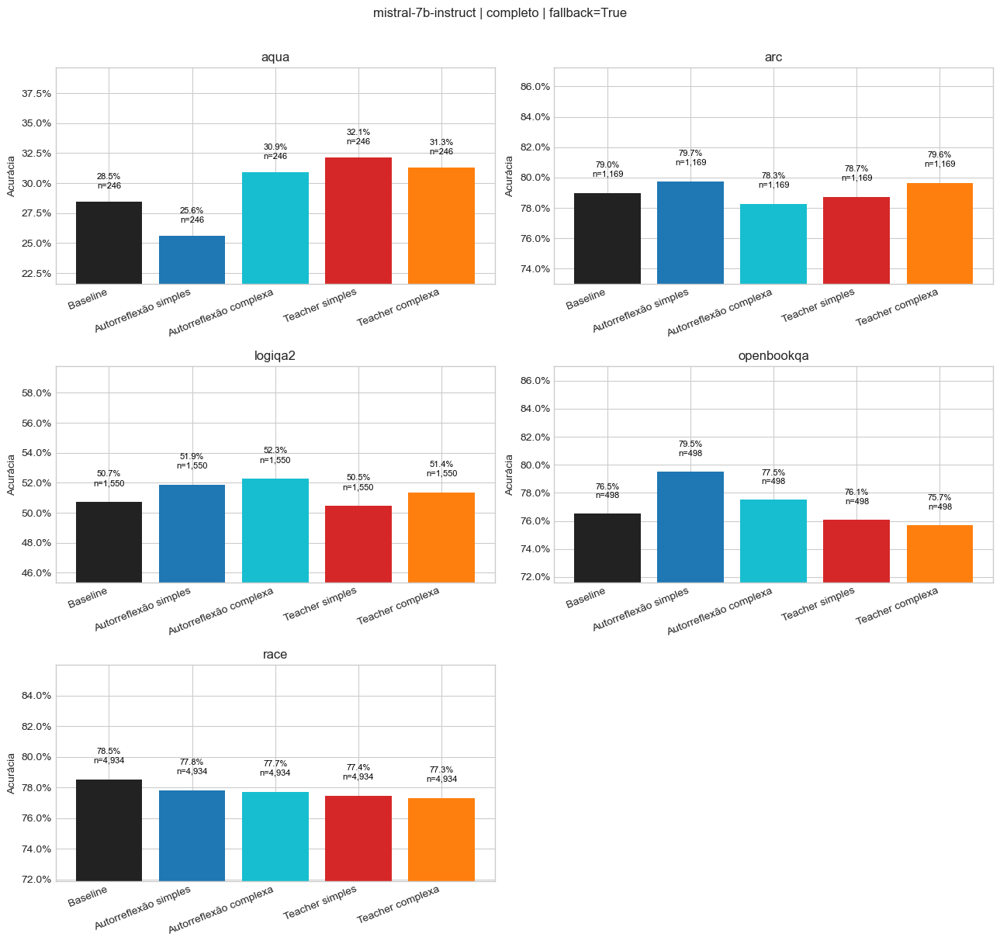

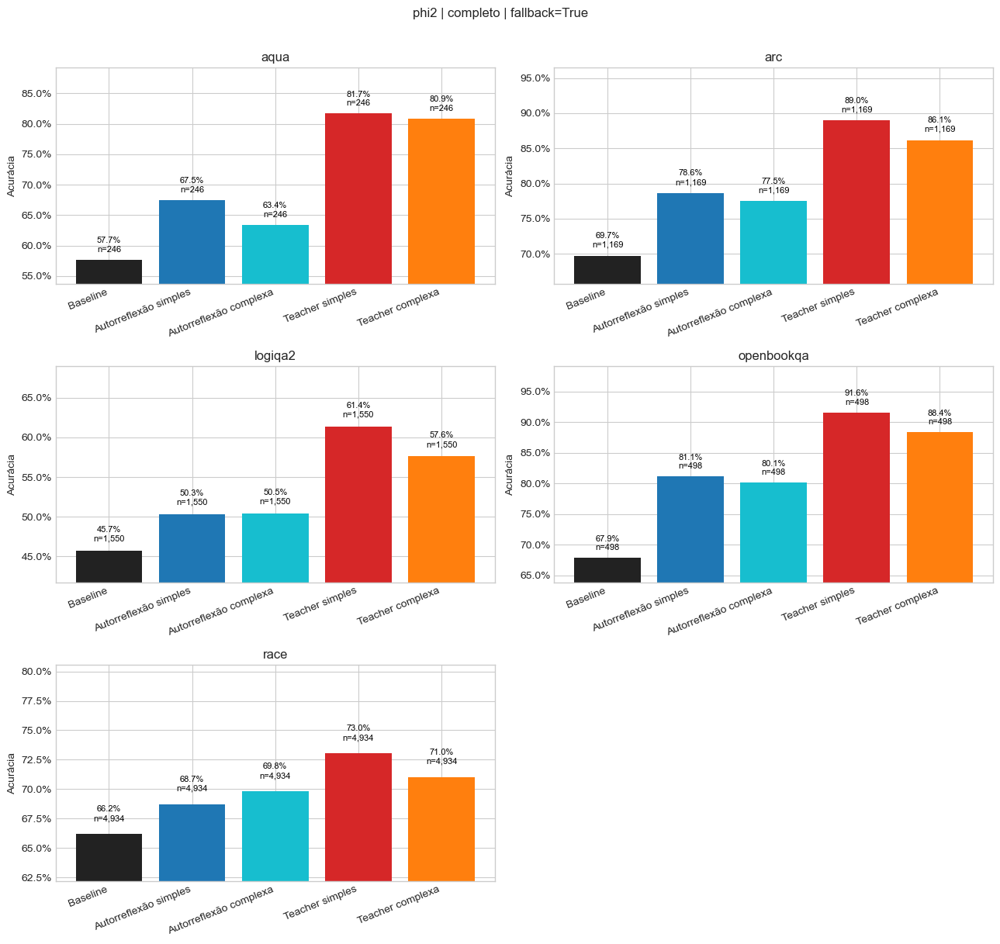

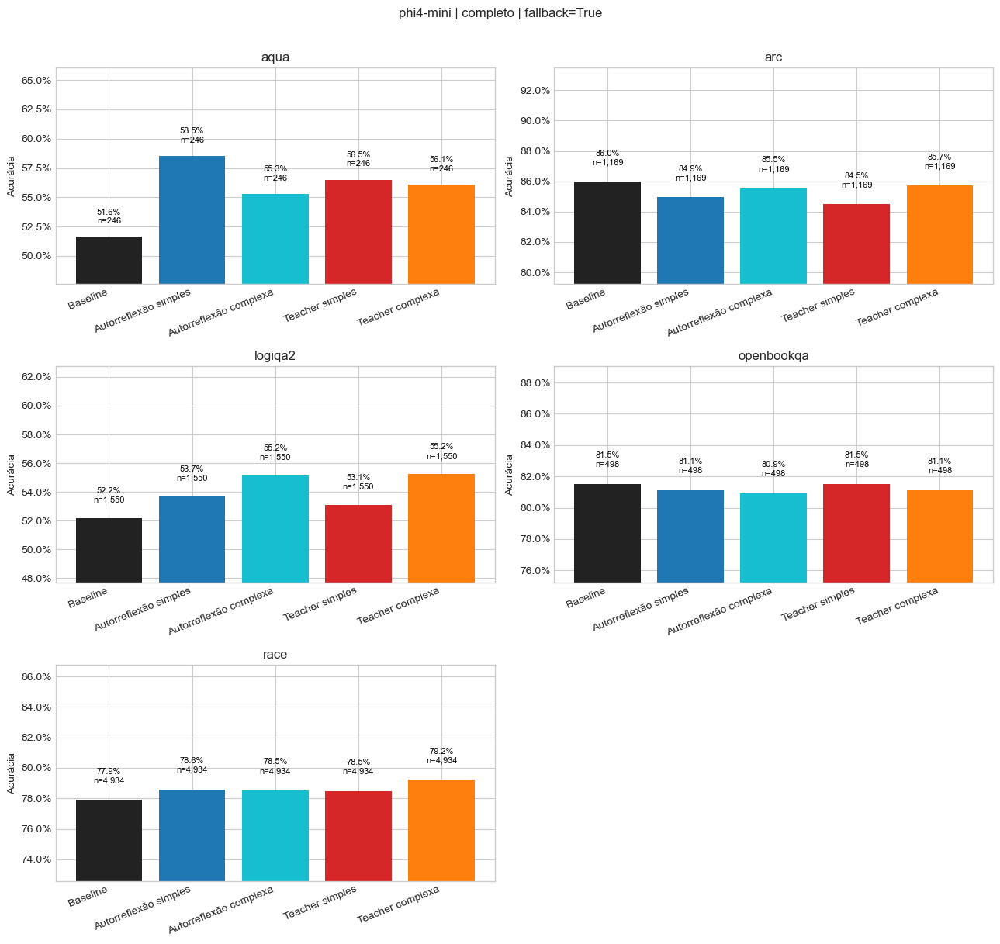

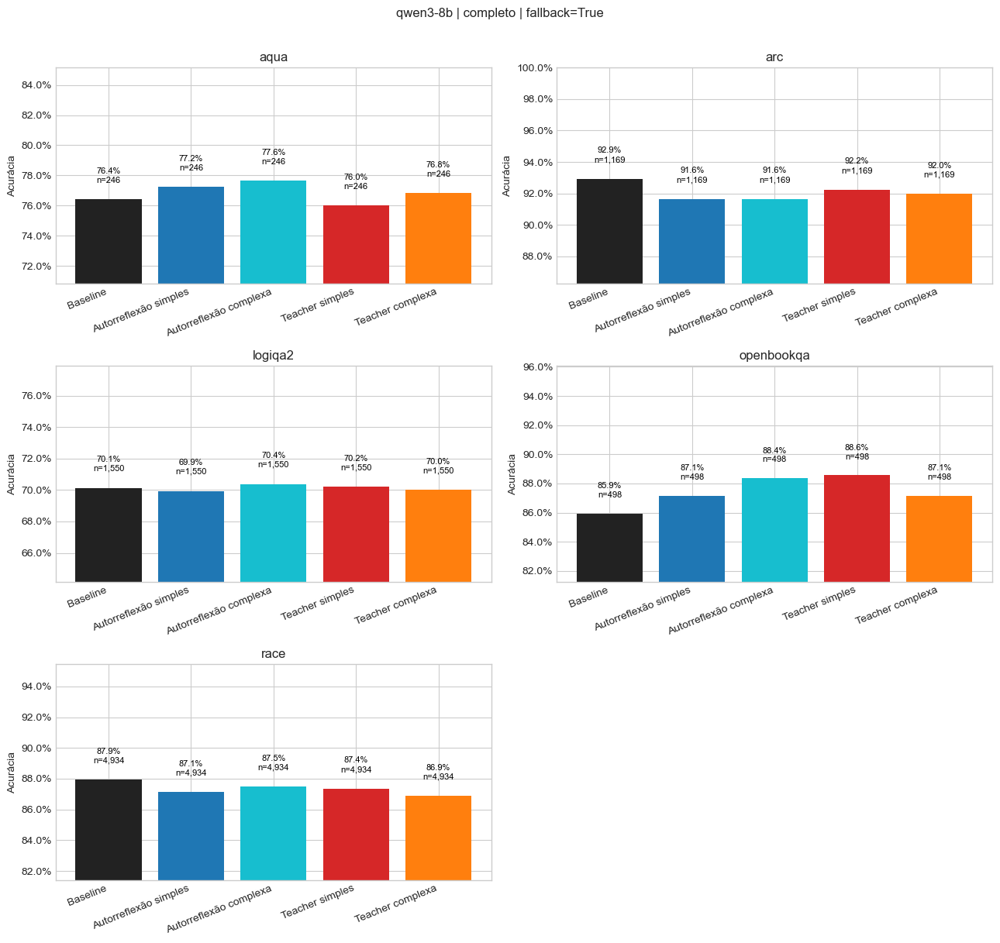

,model,condition,macro_accuracy,correct,n,n_total,n_datasets,n_datasets_scored,n_fallback,micro_accuracy,coverage
0,deepseek-r1-distill-llama-8b,baseline,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
1,deepseek-r1-distill-llama-8b,self_complex,83.51%,6972.000000,8397,8397,5,5,991,83.03%,100.00%
2,deepseek-r1-distill-llama-8b,self_simple,83.59%,6985.000000,8397,8397,5,5,1036,83.18%,100.00%
3,deepseek-r1-distill-llama-8b,teacher_complex,83.66%,6997.000000,8397,8397,5,5,965,83.33%,100.00%
4,deepseek-r1-distill-llama-8b,teacher_simple,83.42%,6965.000000,8397,8397,5,5,1001,82.95%,100.00%
5,gpt-5-4-petrobras,baseline,92.24%,7776.000000,8397,8397,5,5,0,92.60%,100.00%
6,gpt-5-4-petrobras,self_complex,93.32%,7840.000000,8397,8397,5,5,51,93.37%,100.00%
7,gpt-5-4-petrobras,self_simple,93.16%,7848.000000,8397,8397,5,5,81,93.46%,100.00%
8,llama3.1-8b,baseline,68.01%,6391.000000,8397,8397,5,5,0,76.11%,100.00%
9,llama3.1-8b,self_complex,70.31%,6418.000000,8397,8397,5,5,16,76.43%,100.00%


In [3]:
show_metrics(summaries["completo"])
plot_by_dataset(summaries["completo"], "completo", limit_table=summary_limits)
show_metrics(average_datasets(summaries["completo"]))

## 4. Análise com filtros de qualidade

Aplica `CLEAN_EXCLUDE_FLAGS`. A tabela mostra quantas questões usaram reflexão ou baseline. A diferença entre esta seção e a anterior é uma análise de sensibilidade aos critérios de qualidade, não uma nova execução dos modelos.

,model,dataset,condition,n_total,n,correct,n_reflection,n_fallback,n_unanswered,n_below_threshold,accuracy,coverage,fallback_rate
0,deepseek-r1-distill-llama-8b,aqua,baseline,246,246,206.000000,0,0,30,0,83.74%,100.00%,0.00%
1,deepseek-r1-distill-llama-8b,aqua,self_complex,246,246,211.000000,181,65,19,0,85.77%,100.00%,26.42%
2,deepseek-r1-distill-llama-8b,aqua,self_simple,246,246,214.000000,189,57,17,0,86.99%,100.00%,23.17%
3,deepseek-r1-distill-llama-8b,aqua,teacher_complex,246,246,209.000000,192,54,19,0,84.96%,100.00%,21.95%
4,deepseek-r1-distill-llama-8b,aqua,teacher_simple,246,246,209.000000,187,59,18,0,84.96%,100.00%,23.98%
5,deepseek-r1-distill-llama-8b,arc,baseline,1169,1169,1047.000000,0,0,17,0,89.56%,100.00%,0.00%
6,deepseek-r1-distill-llama-8b,arc,self_complex,1169,1169,1057.000000,1118,51,1,0,90.42%,100.00%,4.36%
7,deepseek-r1-distill-llama-8b,arc,self_simple,1169,1169,1048.000000,1108,61,2,0,89.65%,100.00%,5.22%
8,deepseek-r1-distill-llama-8b,arc,teacher_complex,1169,1169,1062.000000,1118,51,2,0,90.85%,100.00%,4.36%
9,deepseek-r1-distill-llama-8b,arc,teacher_simple,1169,1169,1048.000000,1110,59,3,0,89.65%,100.00%,5.05%


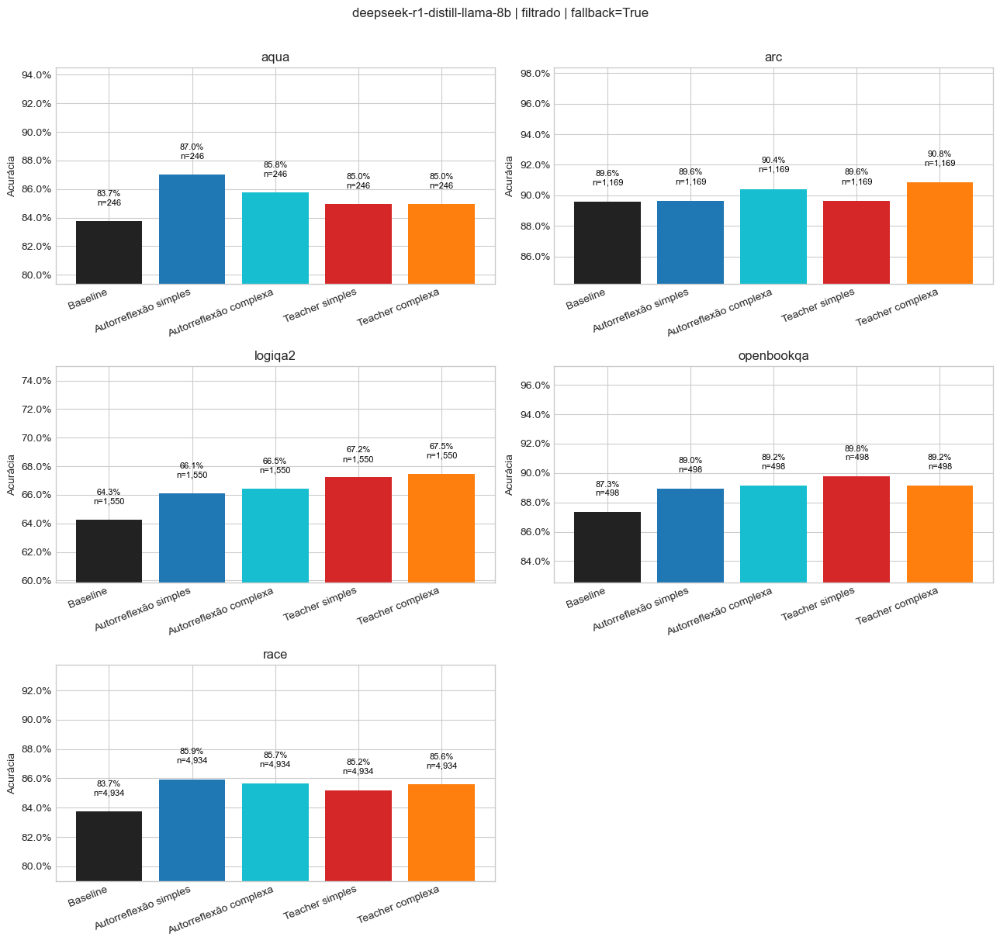

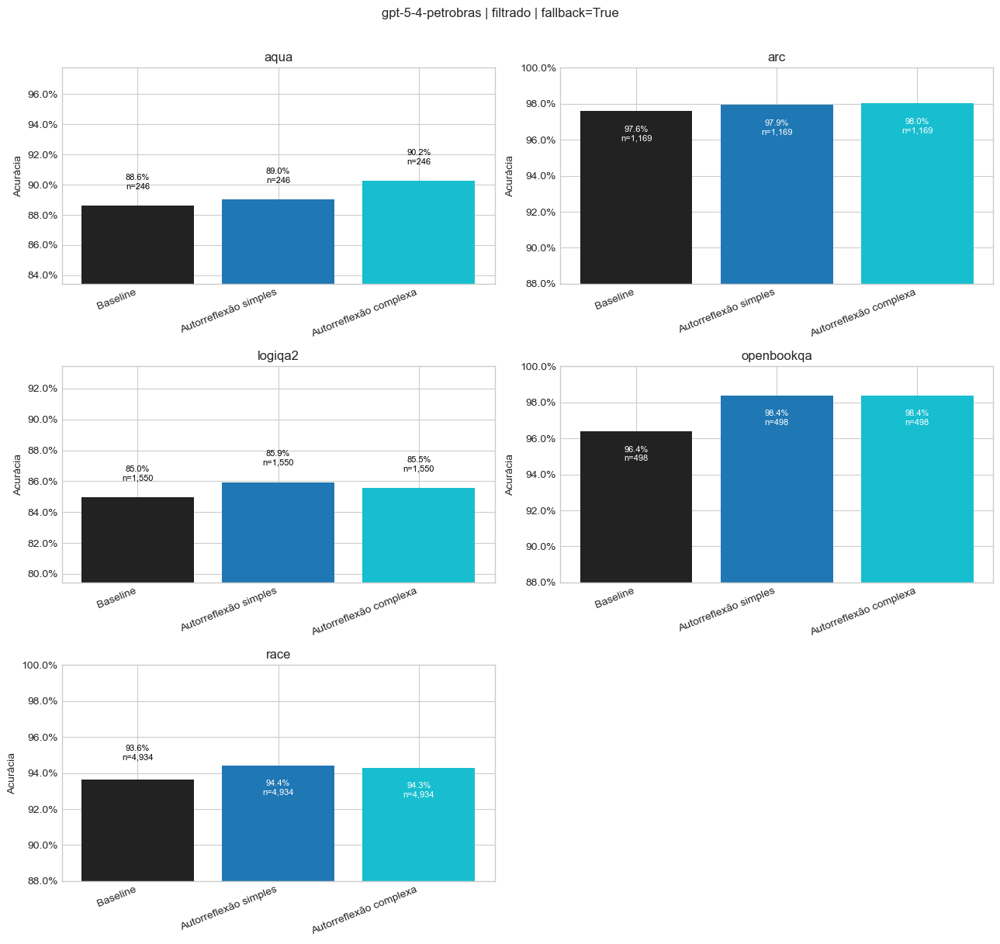

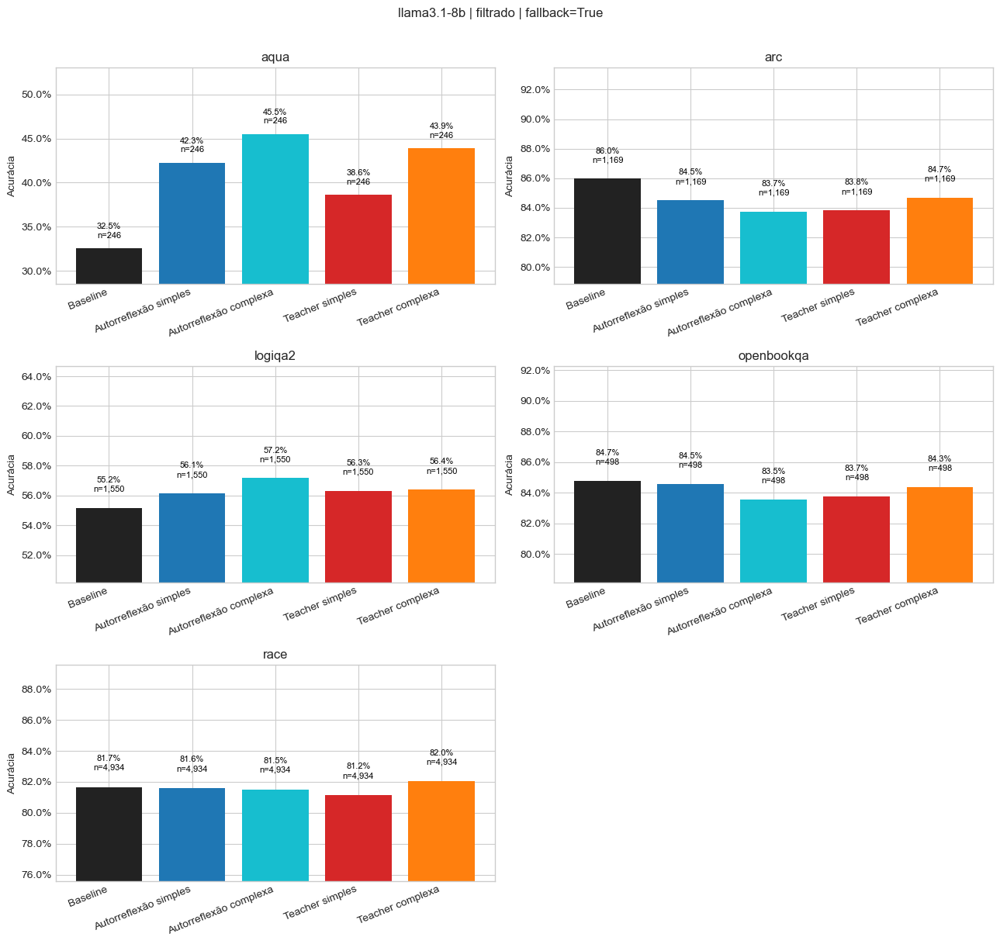

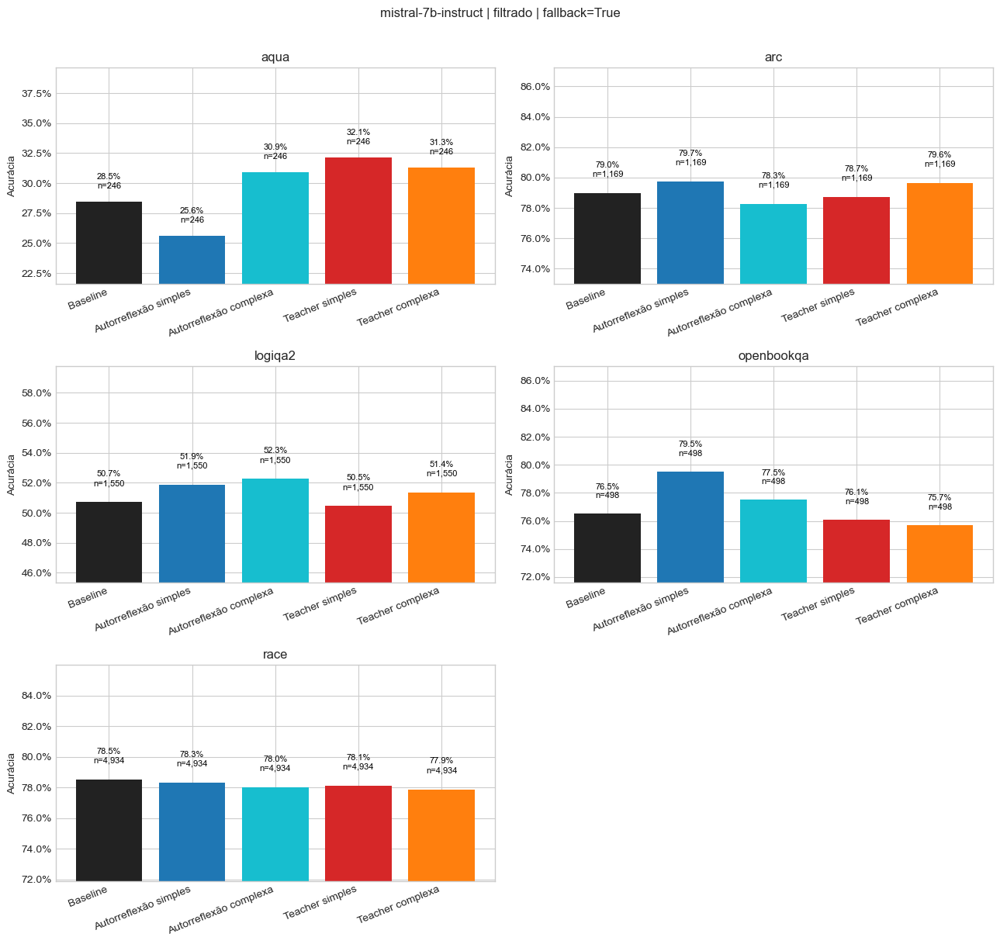

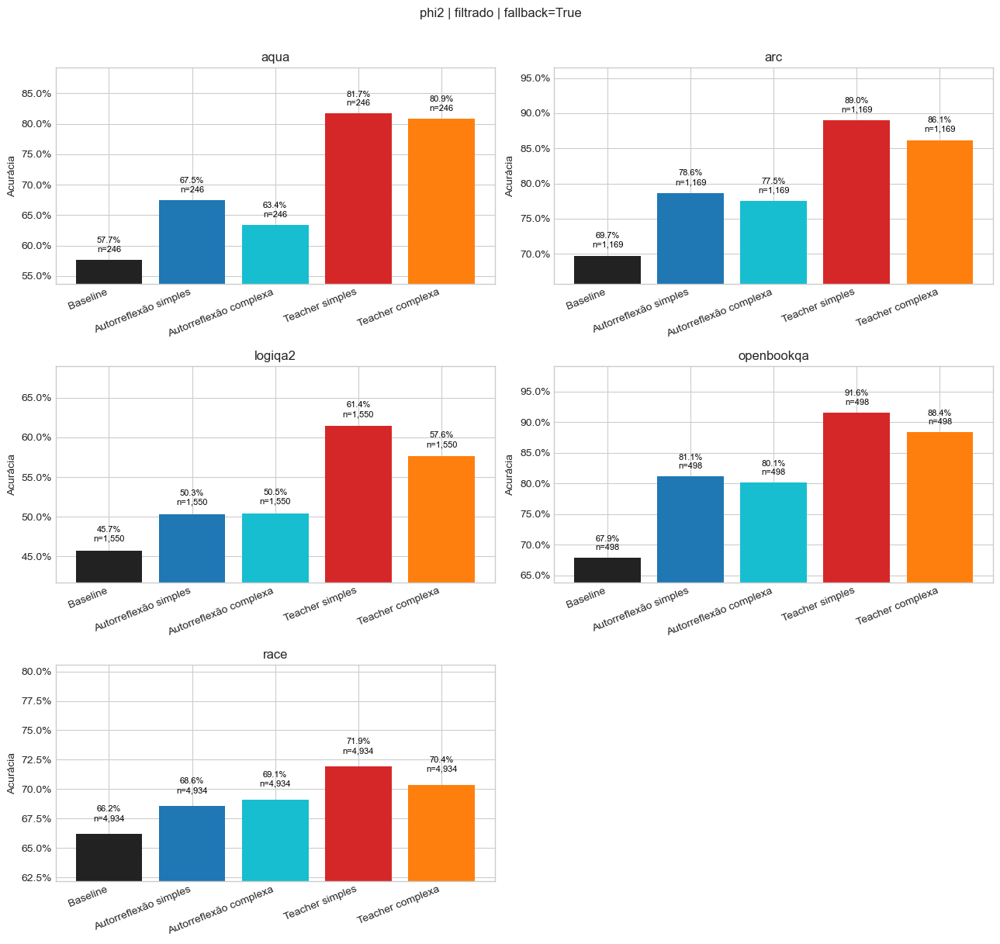

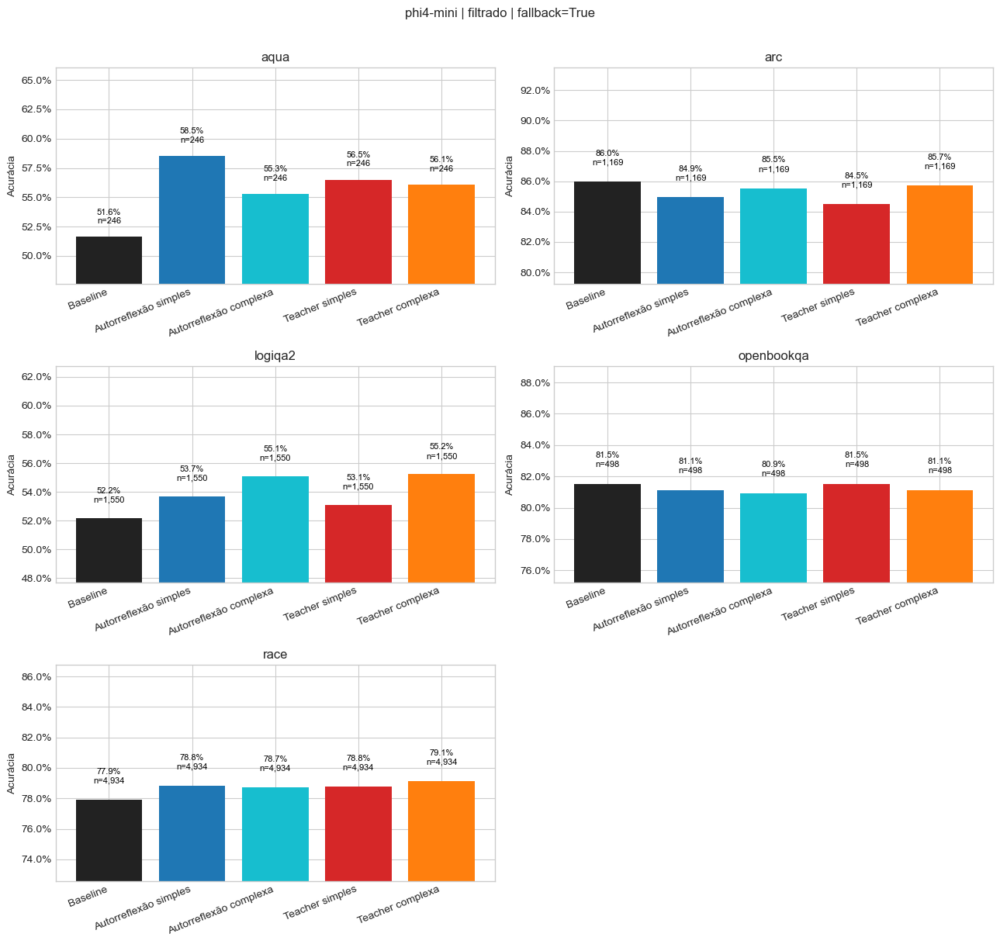

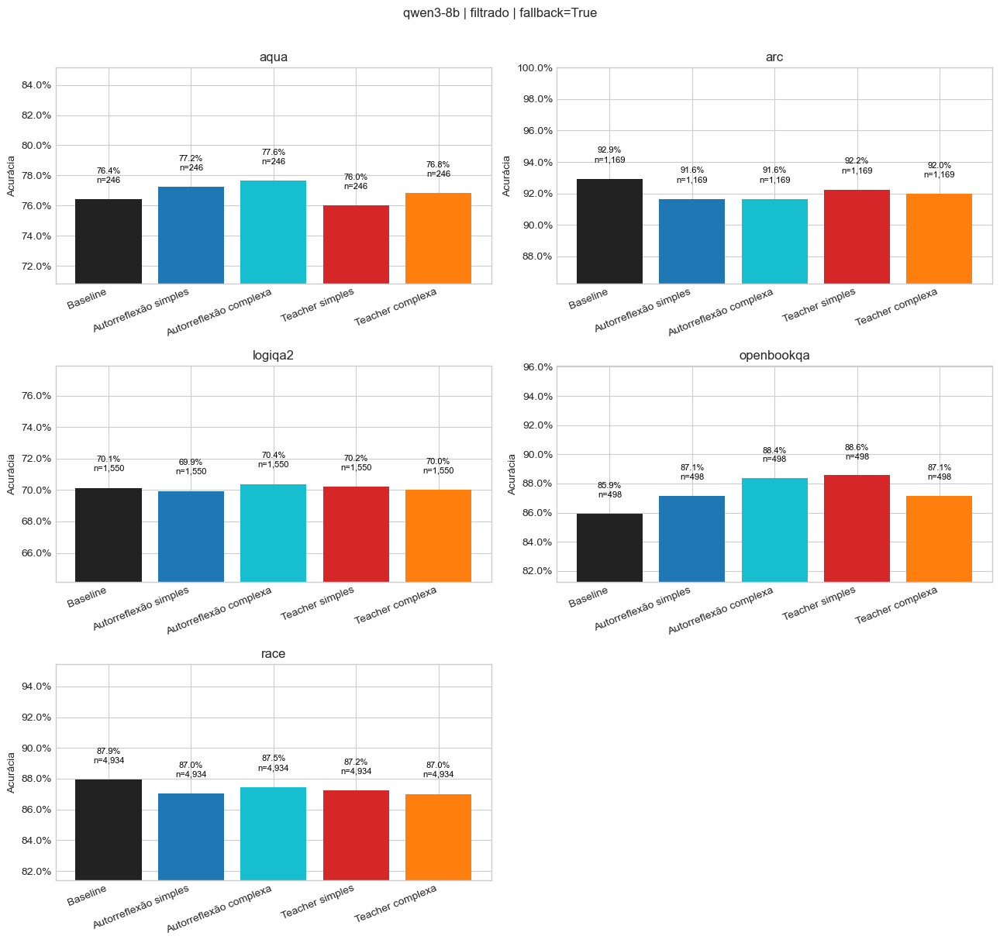

,model,dataset,condition,n_completo,n_filtrado,n_fallback_completo,n_fallback_filtrado,delta_accuracy
0,deepseek-r1-distill-llama-8b,aqua,baseline,246,246,0,0,0.000000
1,deepseek-r1-distill-llama-8b,aqua,self_complex,246,246,65,65,0.000000
2,deepseek-r1-distill-llama-8b,aqua,self_simple,246,246,57,57,0.000000
3,deepseek-r1-distill-llama-8b,aqua,teacher_complex,246,246,54,54,0.000000
4,deepseek-r1-distill-llama-8b,aqua,teacher_simple,246,246,59,59,0.000000
...,...,...,...,...,...,...,...,...
160,qwen3-8b,race,baseline,4934,4934,0,0,0.000000
161,qwen3-8b,race,self_complex,4934,4934,1,764,-0.000203
162,qwen3-8b,race,self_simple,4934,4934,0,763,-0.001013
163,qwen3-8b,race,teacher_complex,4934,4934,0,763,0.001419


In [4]:
show_metrics(summaries["filtrado"])
plot_by_dataset(summaries["filtrado"], "filtrado", limit_table=summary_limits)
comparison = summaries["completo"].merge(summaries["filtrado"], on=GROUP, suffixes=("_completo", "_filtrado"))
comparison["delta_accuracy"] = comparison.accuracy_filtrado - comparison.accuracy_completo
display(comparison[[*GROUP, "n_completo", "n_filtrado", "n_fallback_completo", "n_fallback_filtrado", "delta_accuracy"]])
comparison.to_csv(OUT / "quality_comparison.csv", index=False)

## 5. Acurácia por faixas de similaridade

Como no notebook de validação, as faixas são quantis das similaridades originais por dataset. Os limites são fixados antes dos filtros e compartilhados por modelos/condições. Não confundir faixas disjuntas com thresholds cumulativos da seção seguinte. As tabelas exportadas incluem `n` por faixa.

,dataset,similarity_bin,similarity_mean,similarity_min,similarity_max,n_questions
0,aqua,0,0.719860,0.651580,0.746315,25
1,aqua,1,0.759602,0.747346,0.771744,25
2,aqua,2,0.776991,0.771787,0.785445,24
3,aqua,3,0.793010,0.785718,0.803211,25
4,aqua,4,0.811357,0.803564,0.819288,24
5,aqua,5,0.830557,0.820166,0.840354,25
6,aqua,6,0.857574,0.840925,0.866777,24
7,aqua,7,0.895694,0.869575,0.926479,25
8,aqua,8,0.946659,0.928658,0.958796,24
9,aqua,9,0.971397,0.959524,0.987906,25


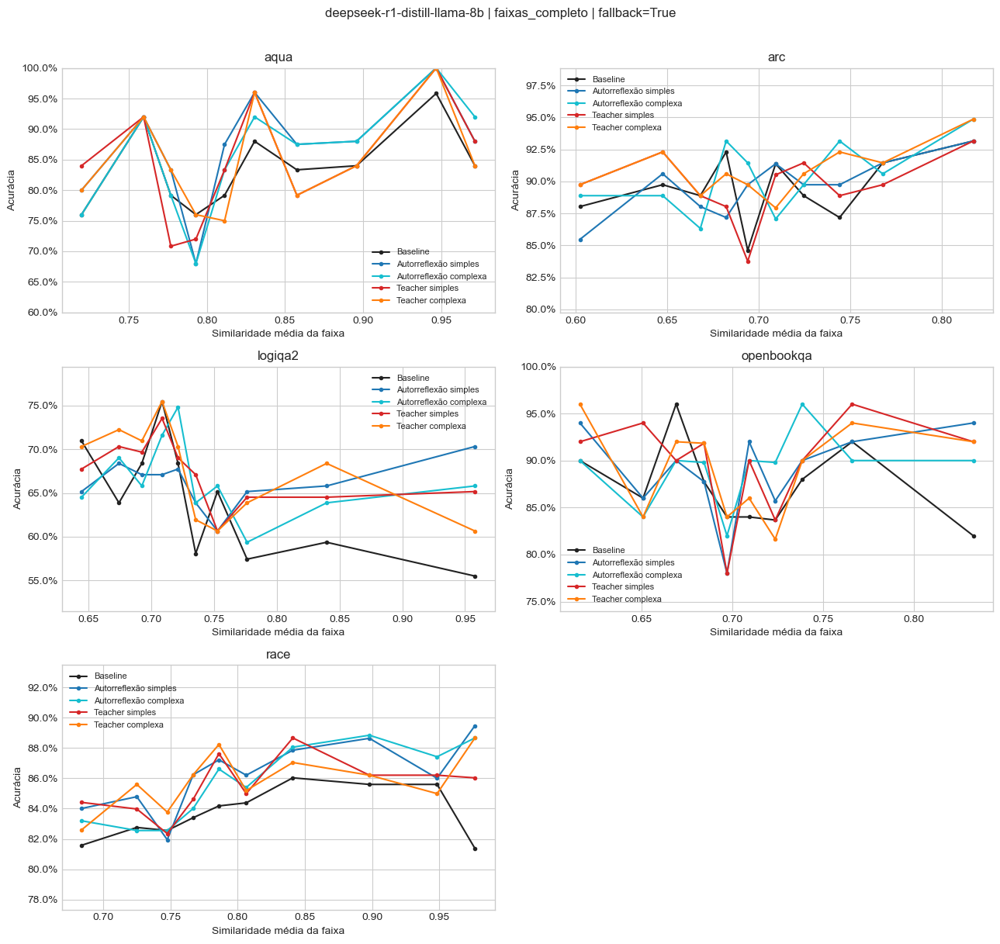

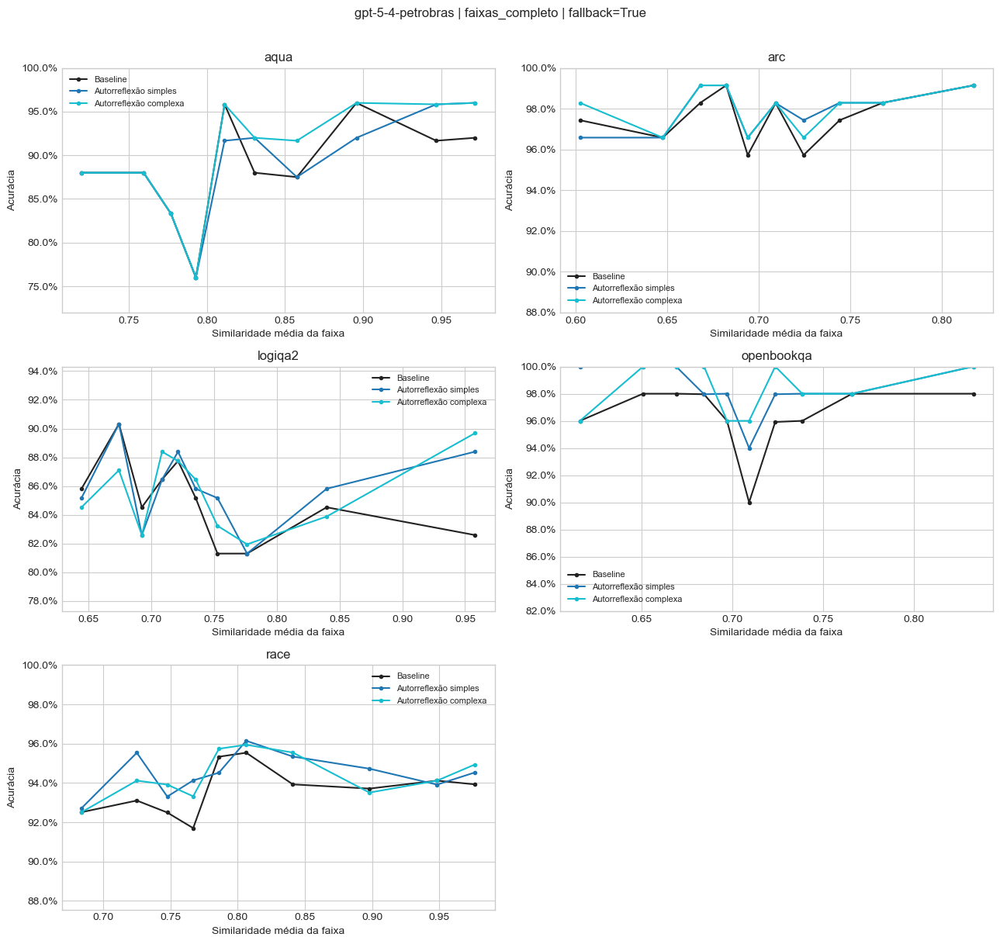

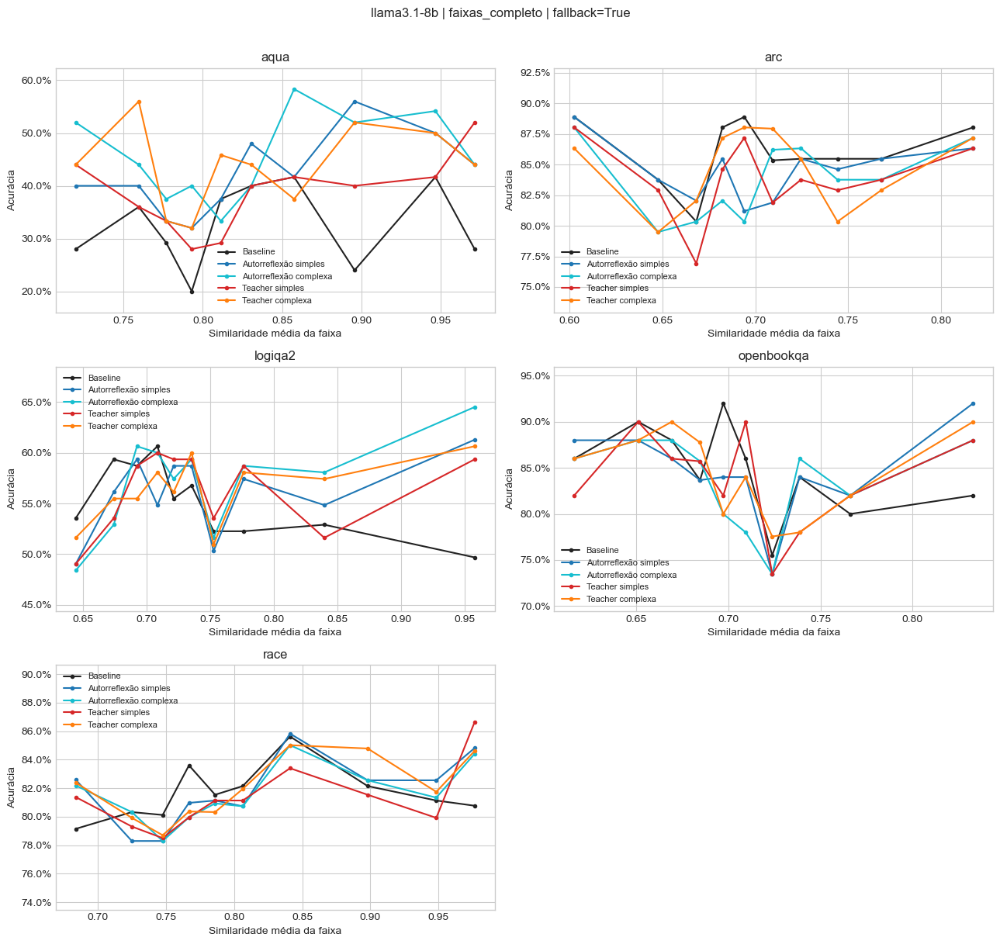

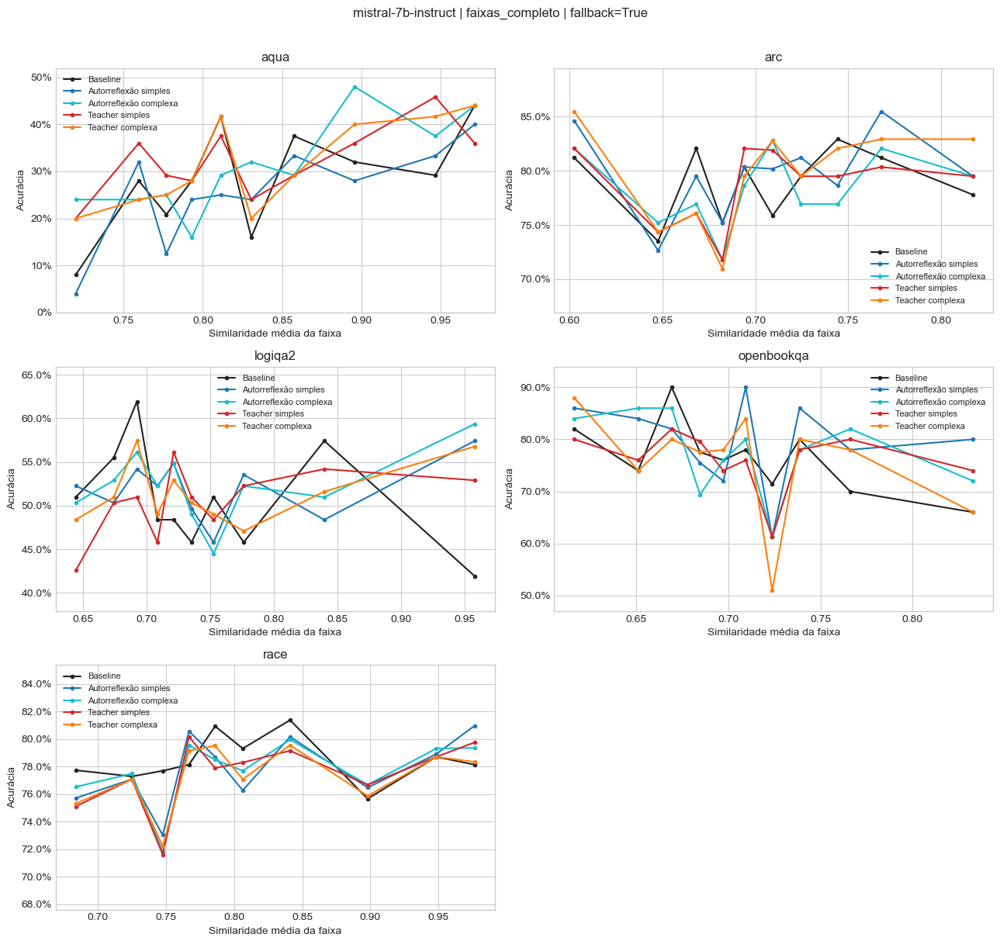

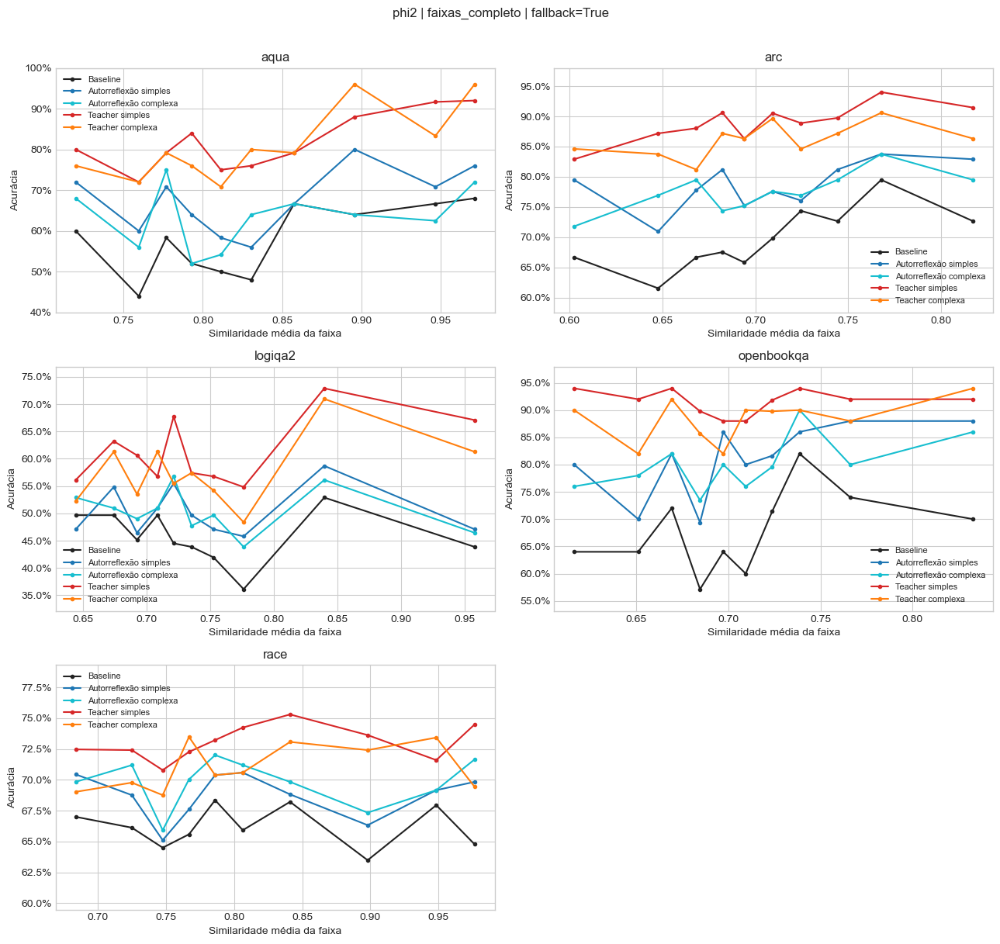

...

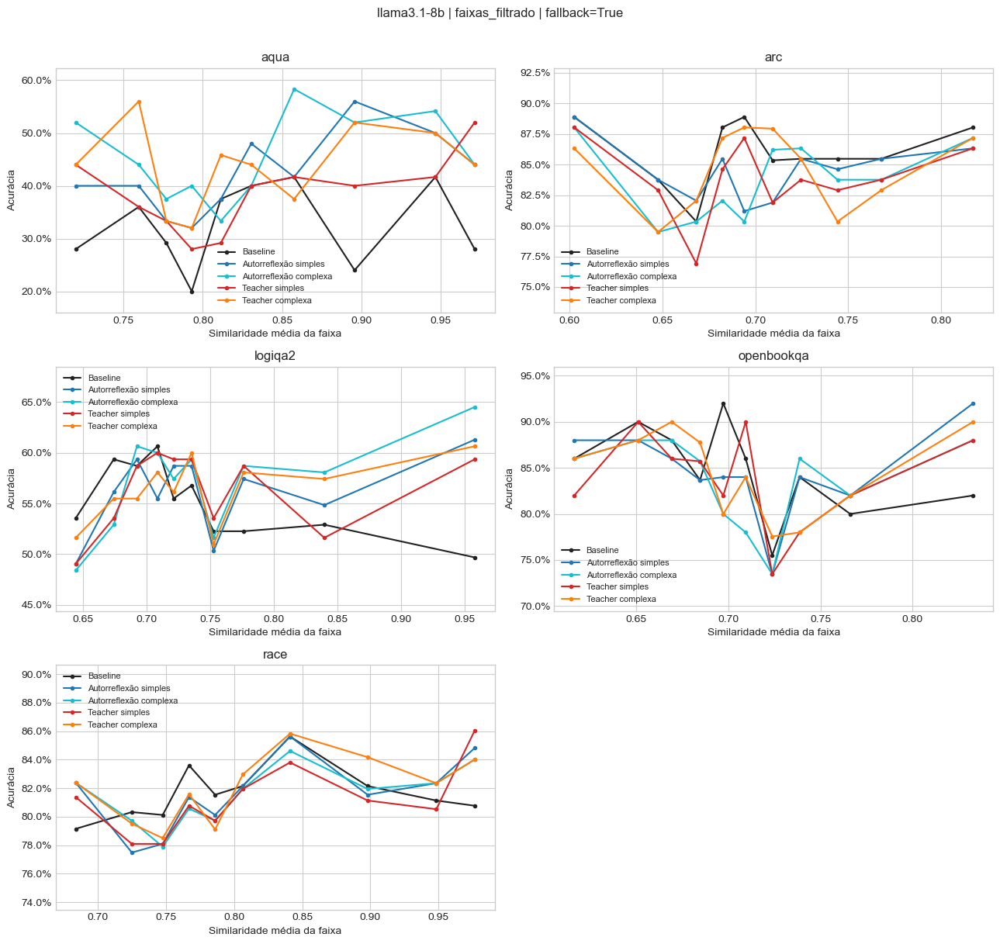

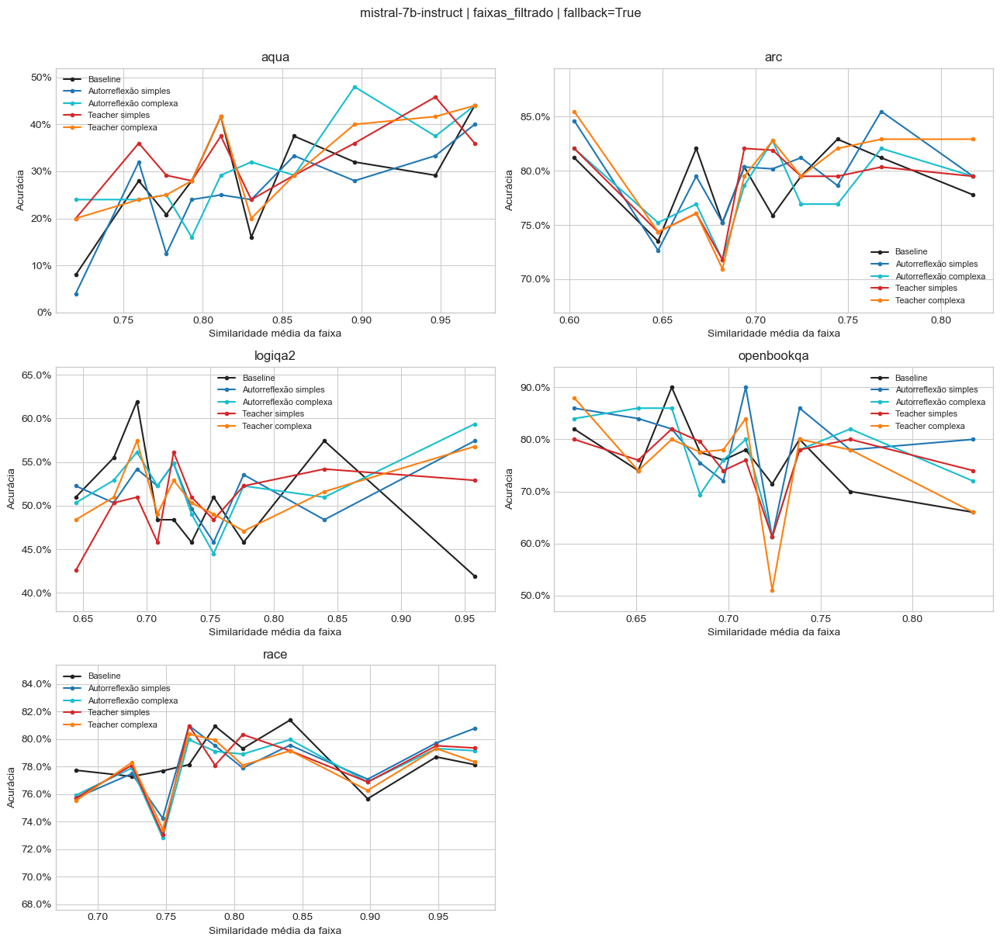

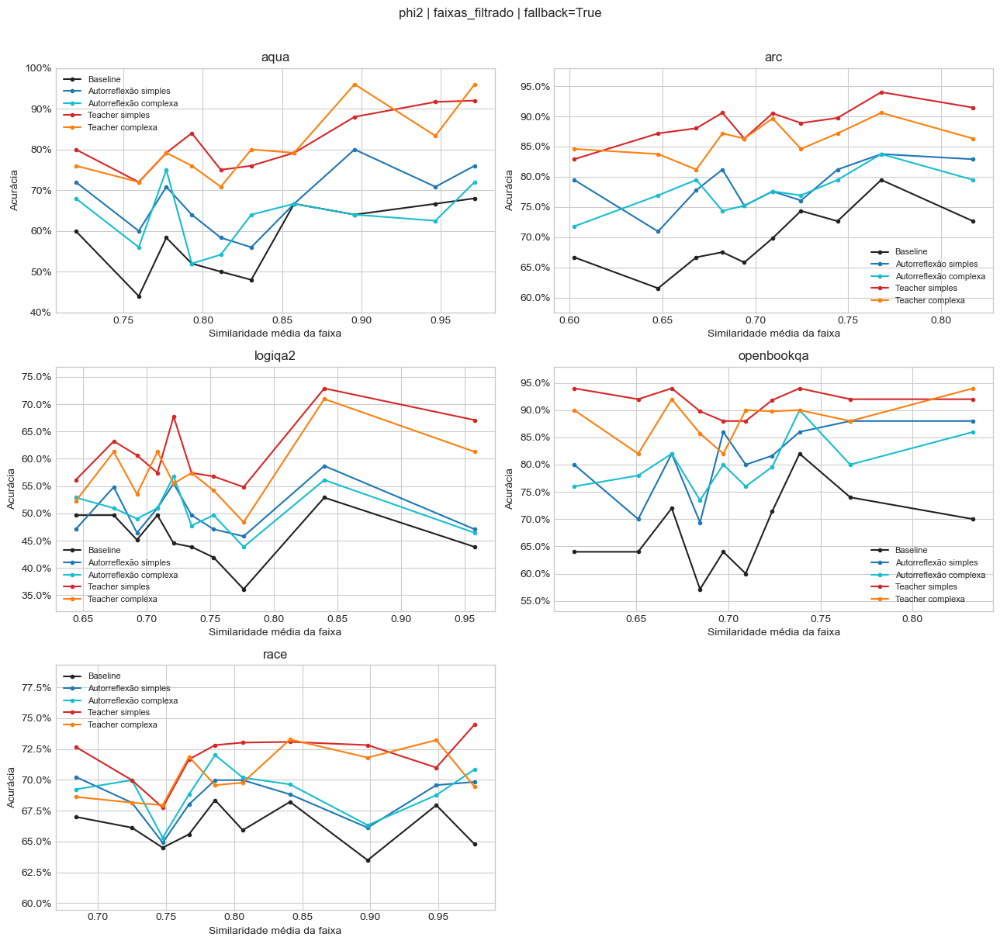

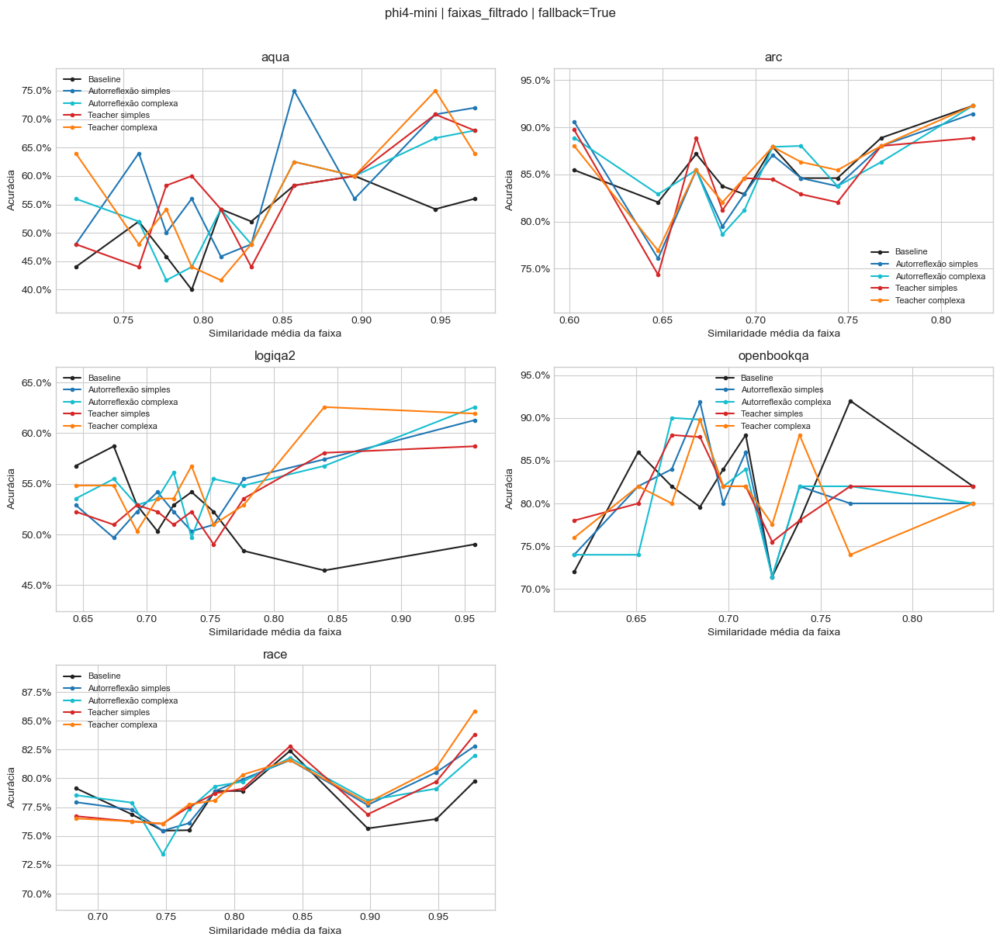

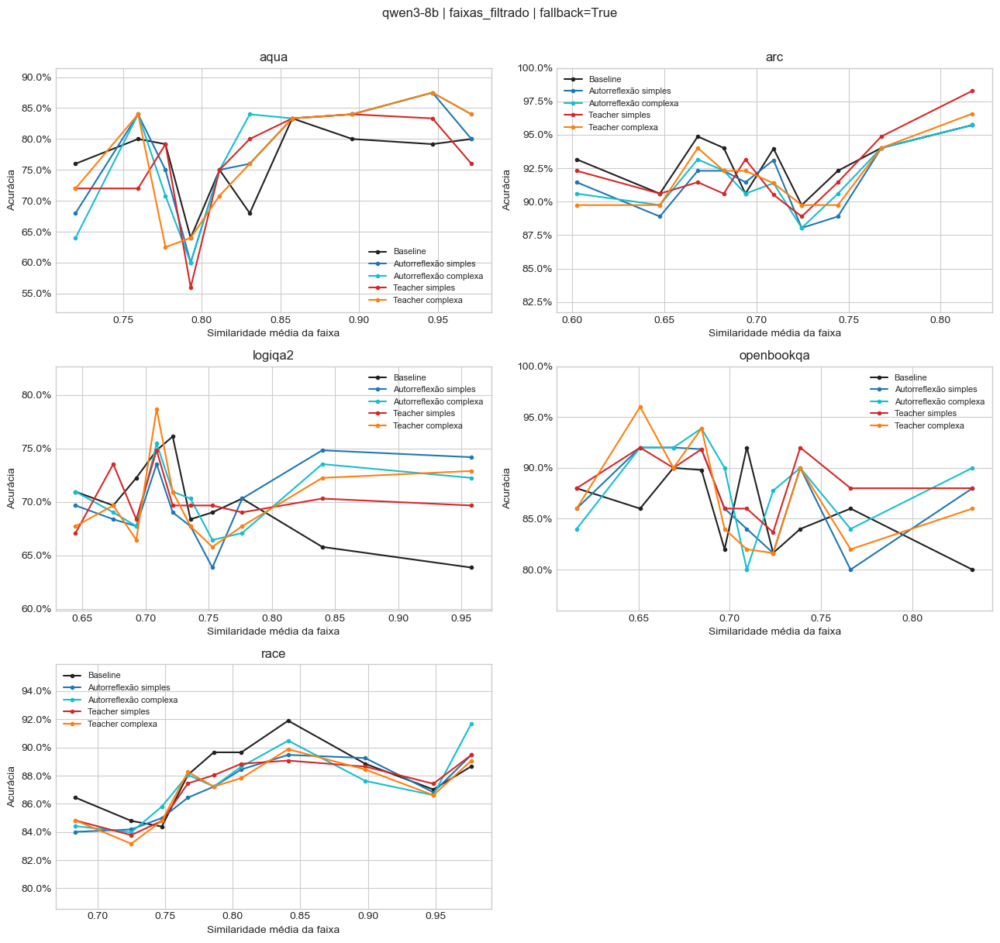

In [7]:
pairs = test[["dataset", "val_uid", "similarity"]].drop_duplicates()
if pairs.duplicated(["dataset", "val_uid"]).any():
    raise ValueError("Similaridades diferentes para a mesma questão entre modelos")
bins = []
for dataset, group in pairs.groupby("dataset"):
    group = group.loc[group.similarity.notna()].copy()
    if group.empty:
        continue
    q = min(N_SIMILARITY_BINS, group.similarity.nunique())
    group["similarity_bin"] = pd.qcut(group.similarity, q=q, labels=False, duplicates="drop") if q > 1 else 0
    bins.append(group)
if bins:
    bin_map = pd.concat(bins)
    bin_info = bin_map.groupby(["dataset", "similarity_bin"]).agg(
        similarity_mean=("similarity", "mean"), similarity_min=("similarity", "min"),
        similarity_max=("similarity", "max"), n_questions=("val_uid", "size")).reset_index()
    display(bin_info)
    binned_tables = {}
    for view, rows in policies.items():
        binned = rows.merge(bin_map[["dataset", "val_uid", "similarity_bin"]], on=["dataset", "val_uid"], how="inner")
        metrics = summarize_policy(binned, [*GROUP, "similarity_bin"]).merge(bin_info, on=["dataset", "similarity_bin"])
        metrics.to_csv(OUT / f"similarity_bins_{view}.csv", index=False)
        binned_tables[view] = metrics
    bin_limits = pd.concat(binned_tables.values(), ignore_index=True)
    for view, metrics in binned_tables.items():
        plot_by_dataset(metrics, f"faixas_{view}", "similarity_mean", limit_table=bin_limits)
else:
    print("Não há similaridades disponíveis para construir faixas.")

## 6. Thresholds e acurácia média das configurações

Para cada threshold, a reflexão só é usada se a similaridade for **maior ou igual** ao valor. Fora disso, a variável principal determina baseline ou exclusão.

- **Macro:** média simples das acurácias dos datasets; cada dataset tem o mesmo peso. Se algum dataset ficar sem amostras, a macro fica indefinida.
- **Micro:** acertos totais divididos pelo total de amostras selecionadas; RACE tem peso maior pelo seu tamanho.
- As curvas do teste são descritivas: não selecionamos o melhor threshold a partir delas.
- No modo sem fallback, confira a cobertura: uma acurácia maior pode refletir apenas um conjunto menor e mais fácil. Não há garantia de crescimento monotônico.

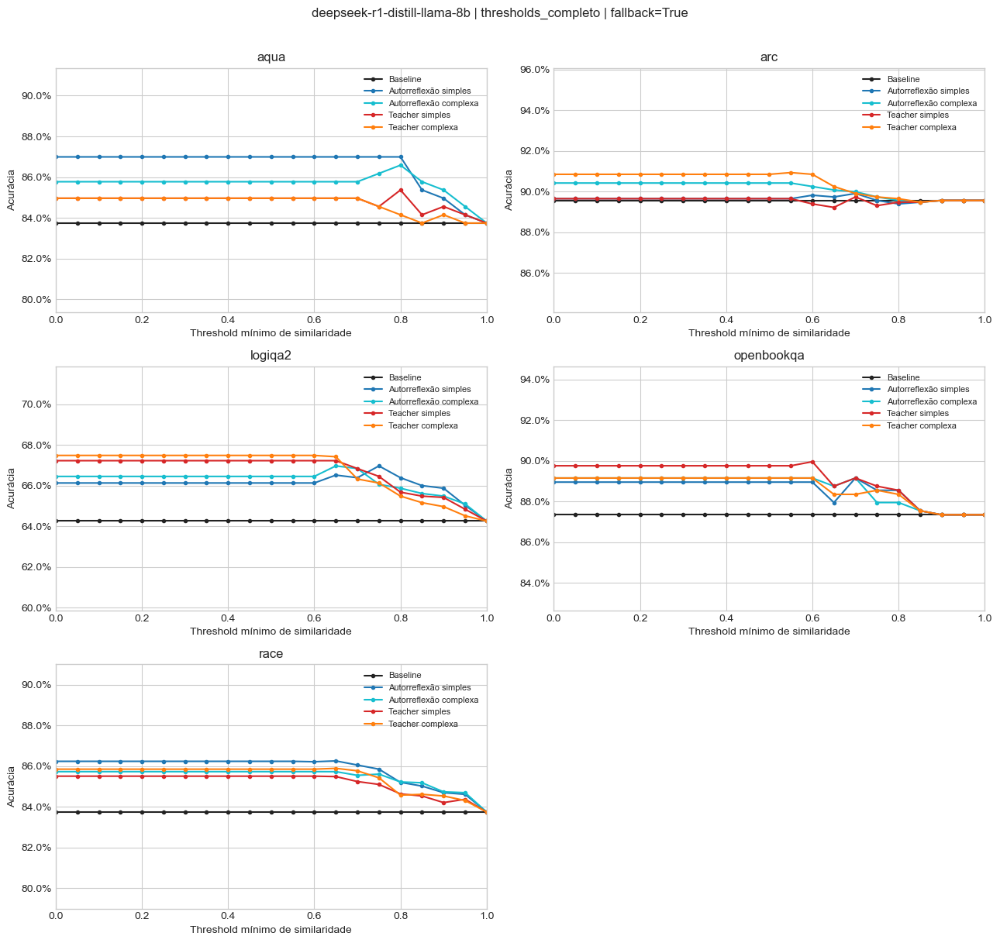

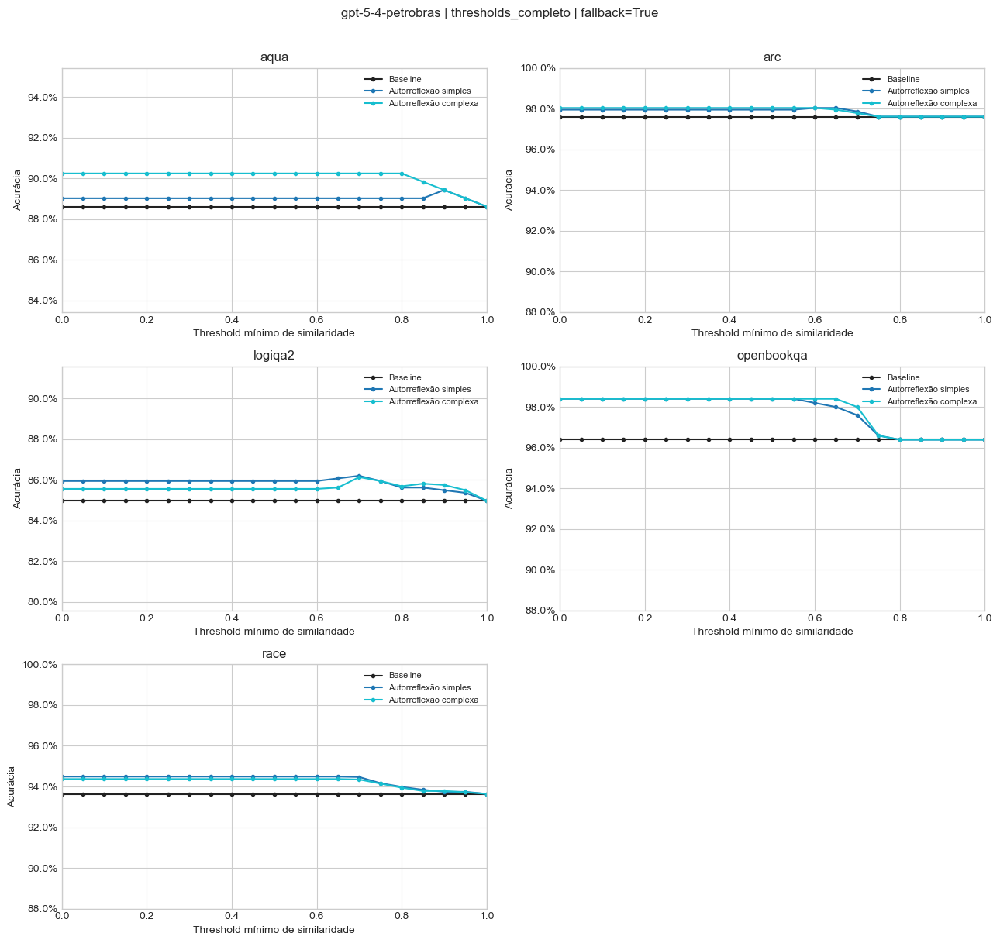

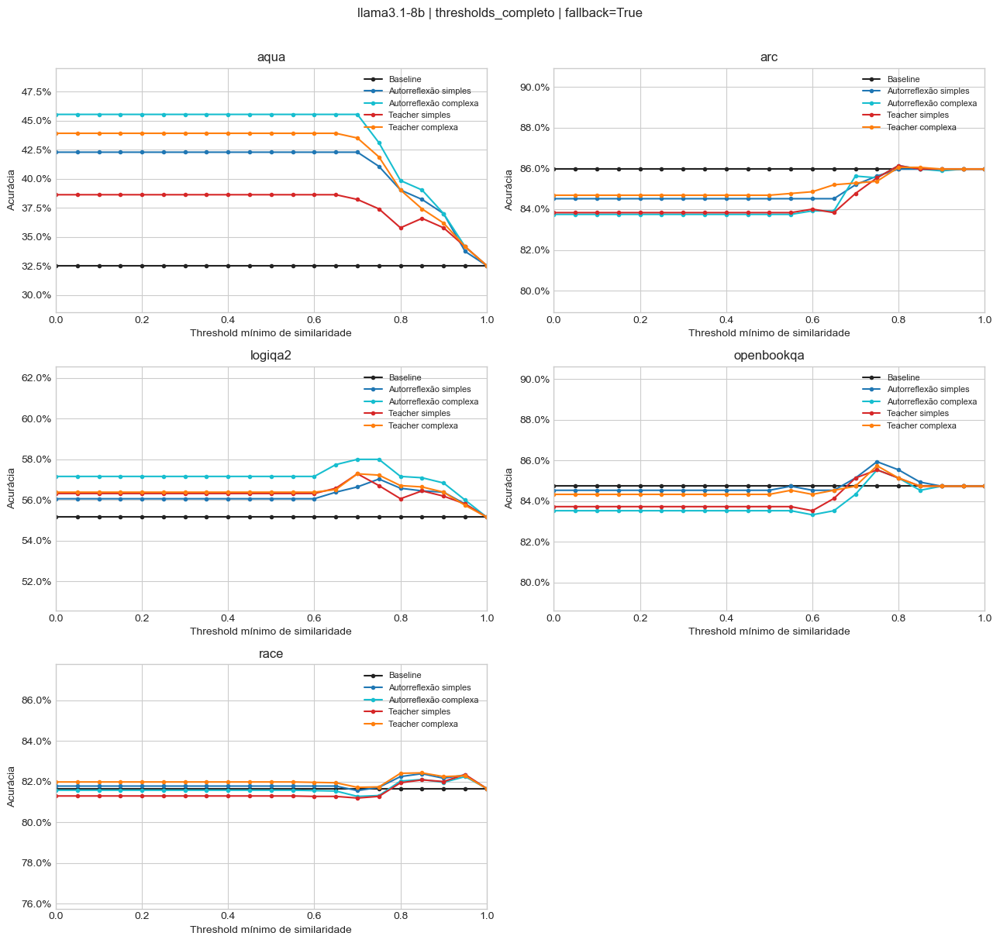

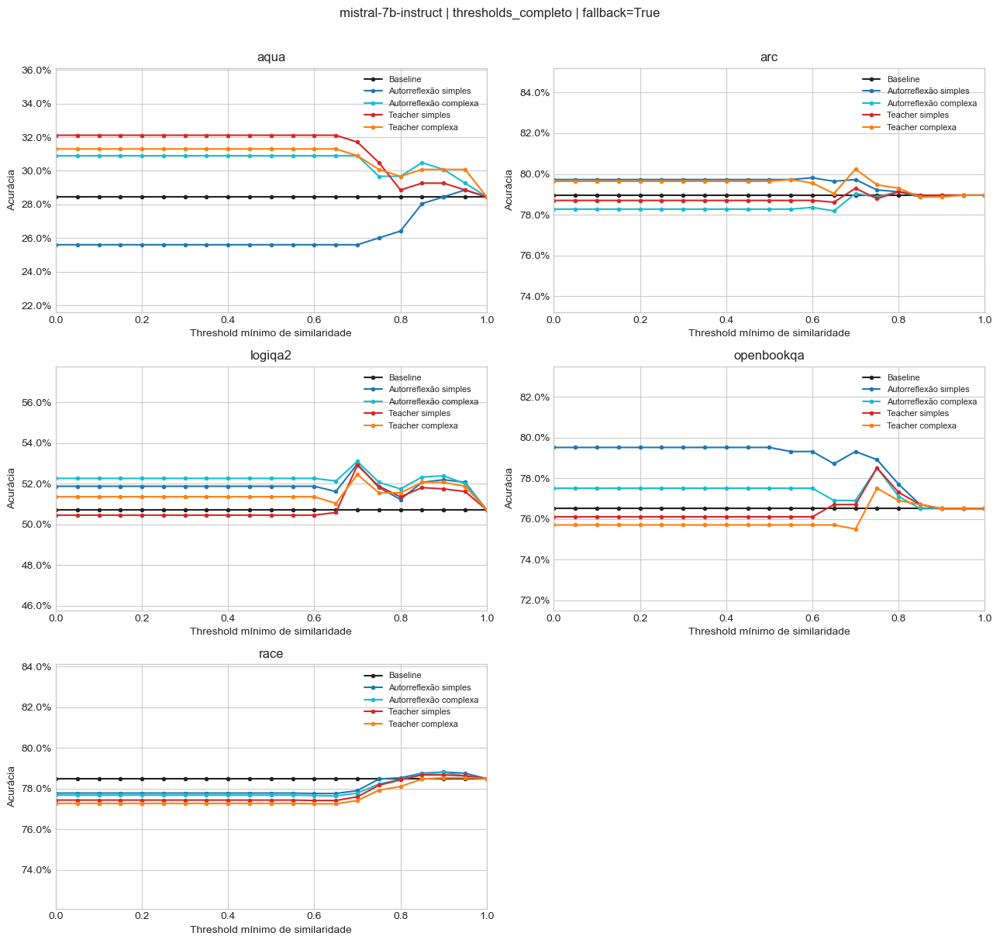

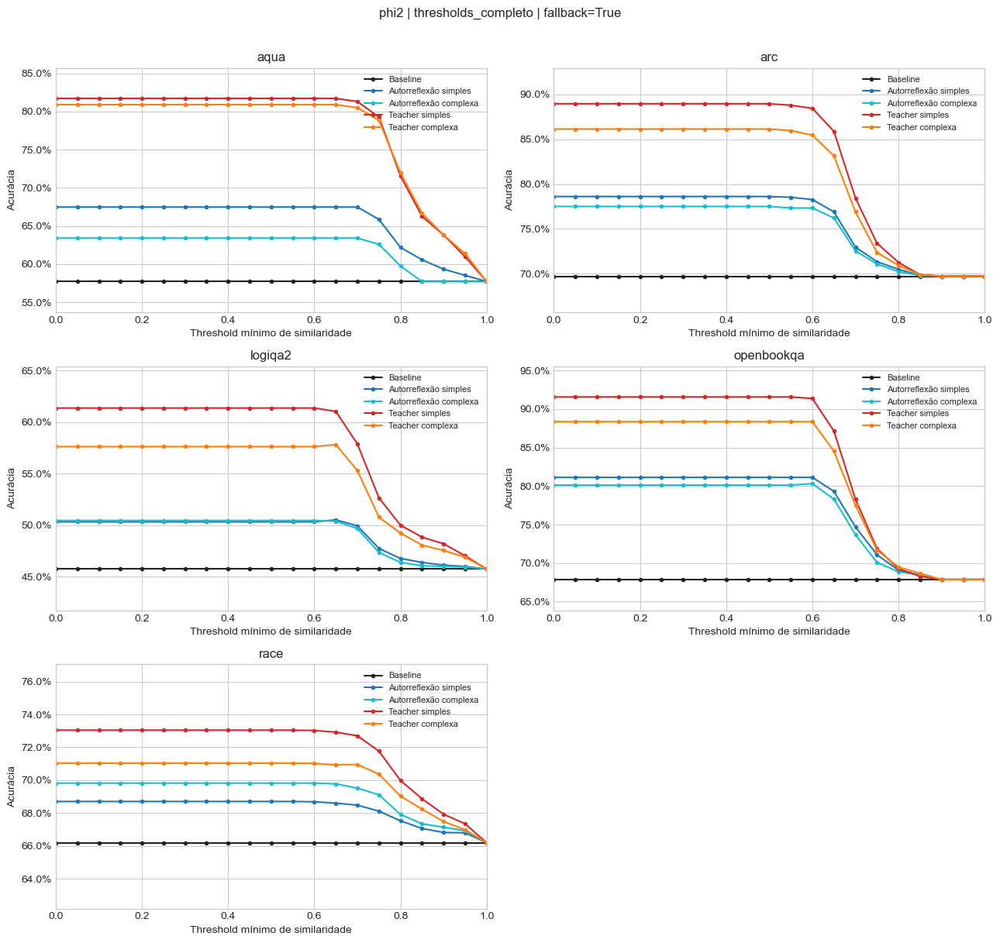

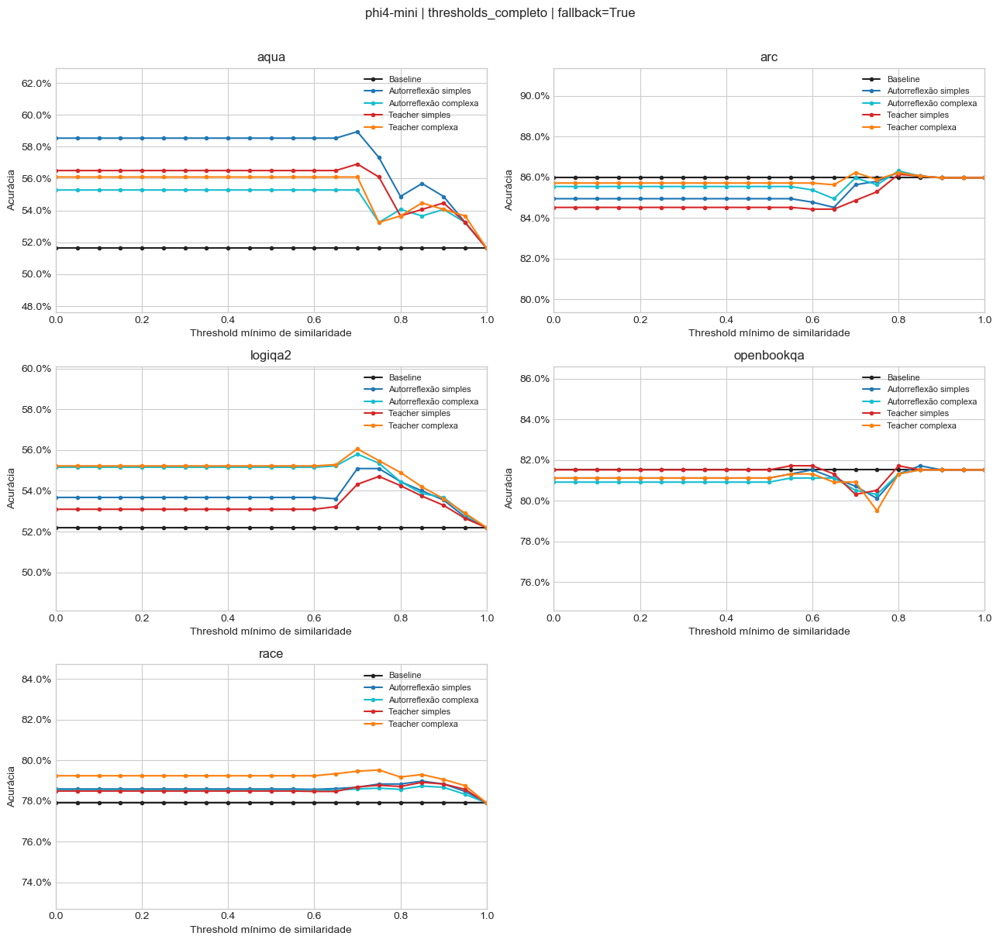

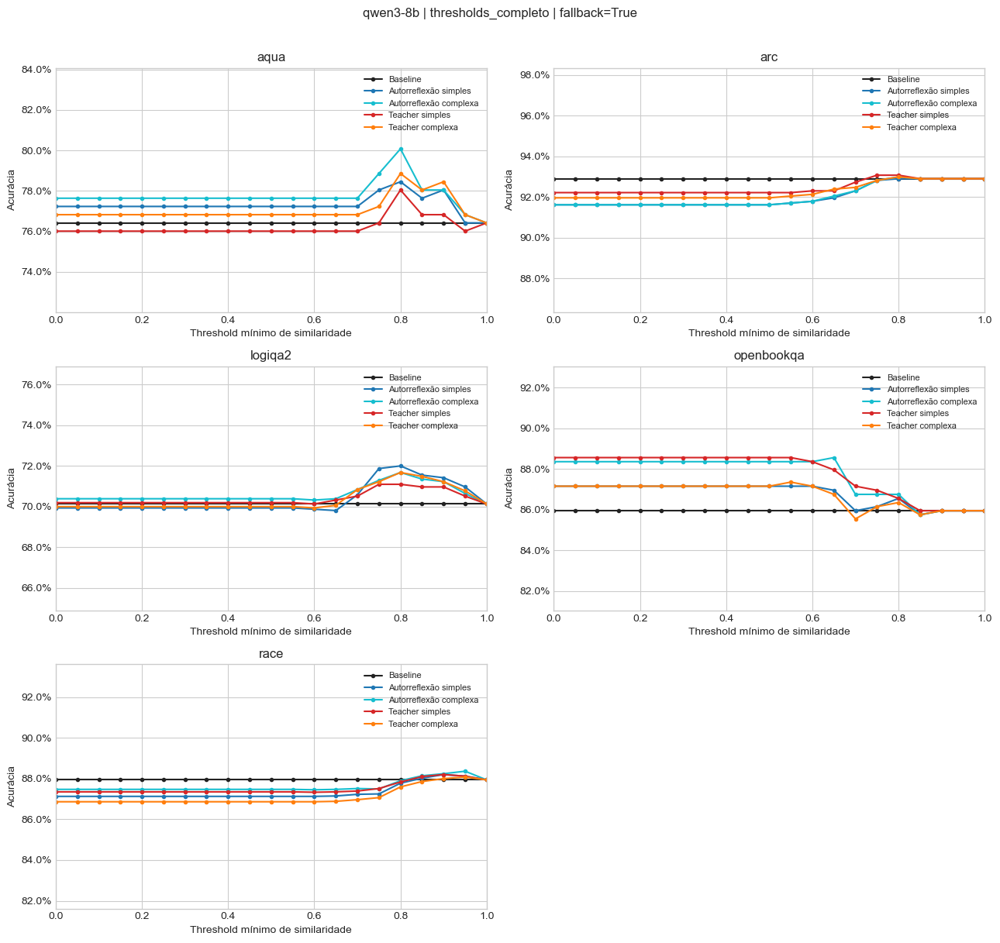

Médias por configuração — completo (tabela completa exportada)


,model,condition,threshold,macro_accuracy,correct,n,n_total,n_datasets,n_datasets_scored,n_fallback,micro_accuracy,coverage
0,deepseek-r1-distill-llama-8b,baseline,-1.000000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
11,deepseek-r1-distill-llama-8b,baseline,0.500000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
15,deepseek-r1-distill-llama-8b,baseline,0.700000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
17,deepseek-r1-distill-llama-8b,baseline,0.800000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
19,deepseek-r1-distill-llama-8b,baseline,0.900000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
21,deepseek-r1-distill-llama-8b,baseline,1.000000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
22,deepseek-r1-distill-llama-8b,self_complex,-1.000000,83.51%,6972.000000,8397,8397,5,5,991,83.03%,100.00%
33,deepseek-r1-distill-llama-8b,self_complex,0.500000,83.51%,6972.000000,8397,8397,5,5,991,83.03%,100.00%
37,deepseek-r1-distill-llama-8b,self_complex,0.700000,83.46%,6964.000000,8397,8397,5,5,2448,82.93%,100.00%
39,deepseek-r1-distill-llama-8b,self_complex,0.800000,83.04%,6924.000000,8397,8397,5,5,5862,82.46%,100.00%


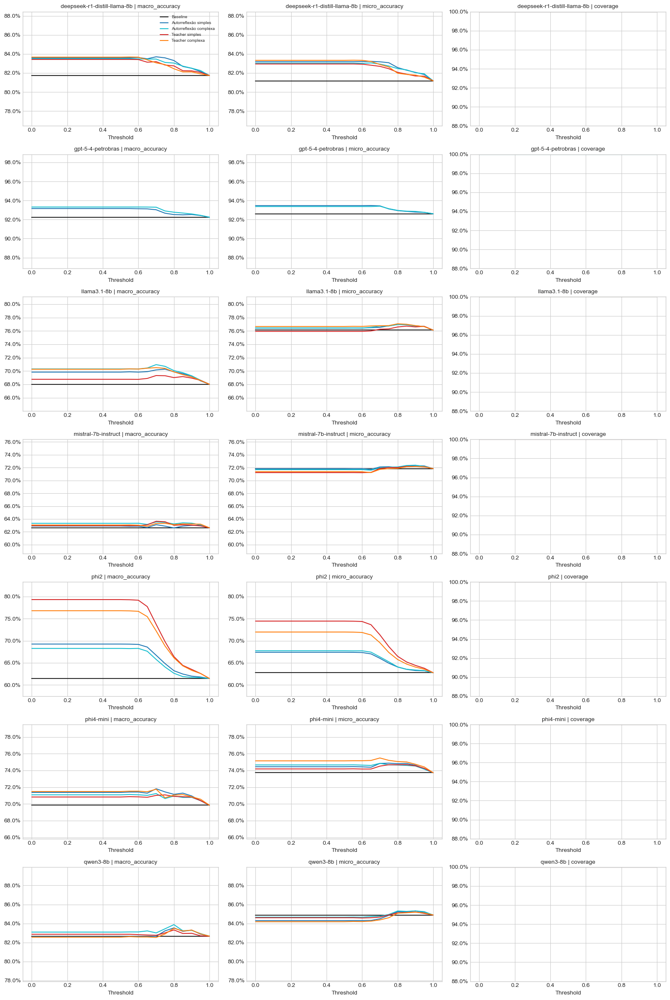

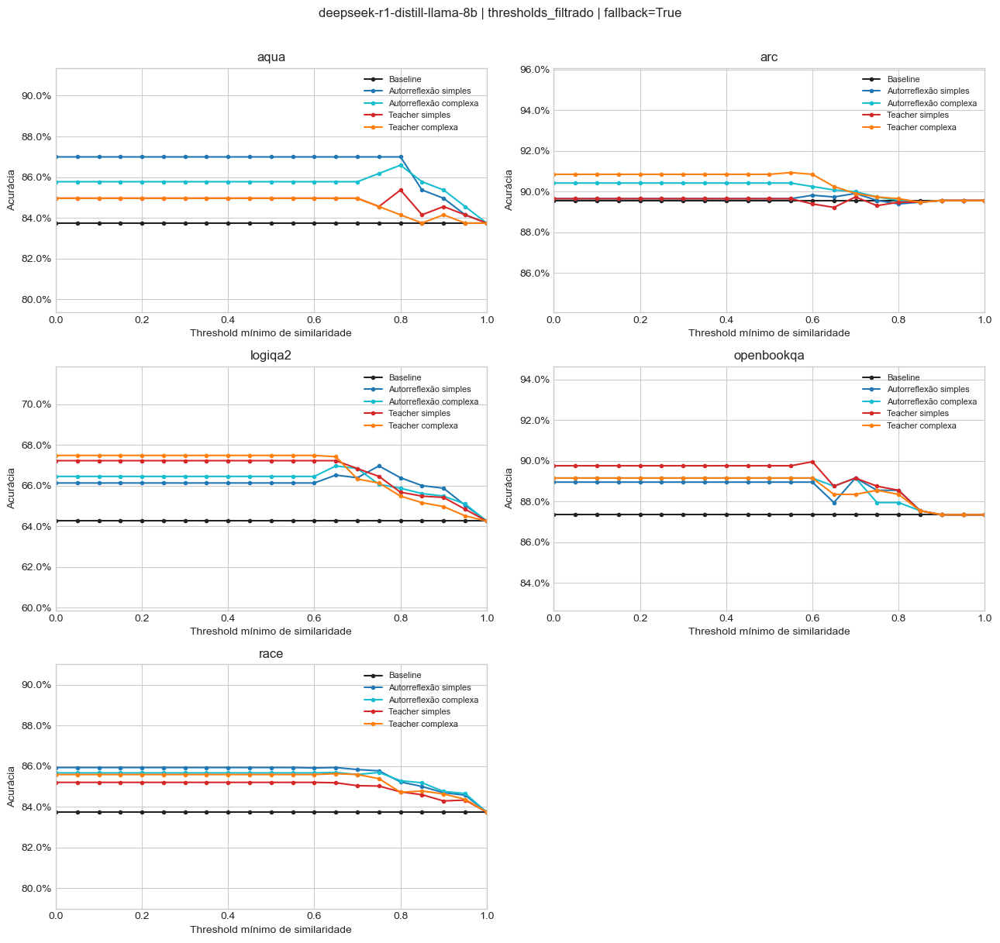

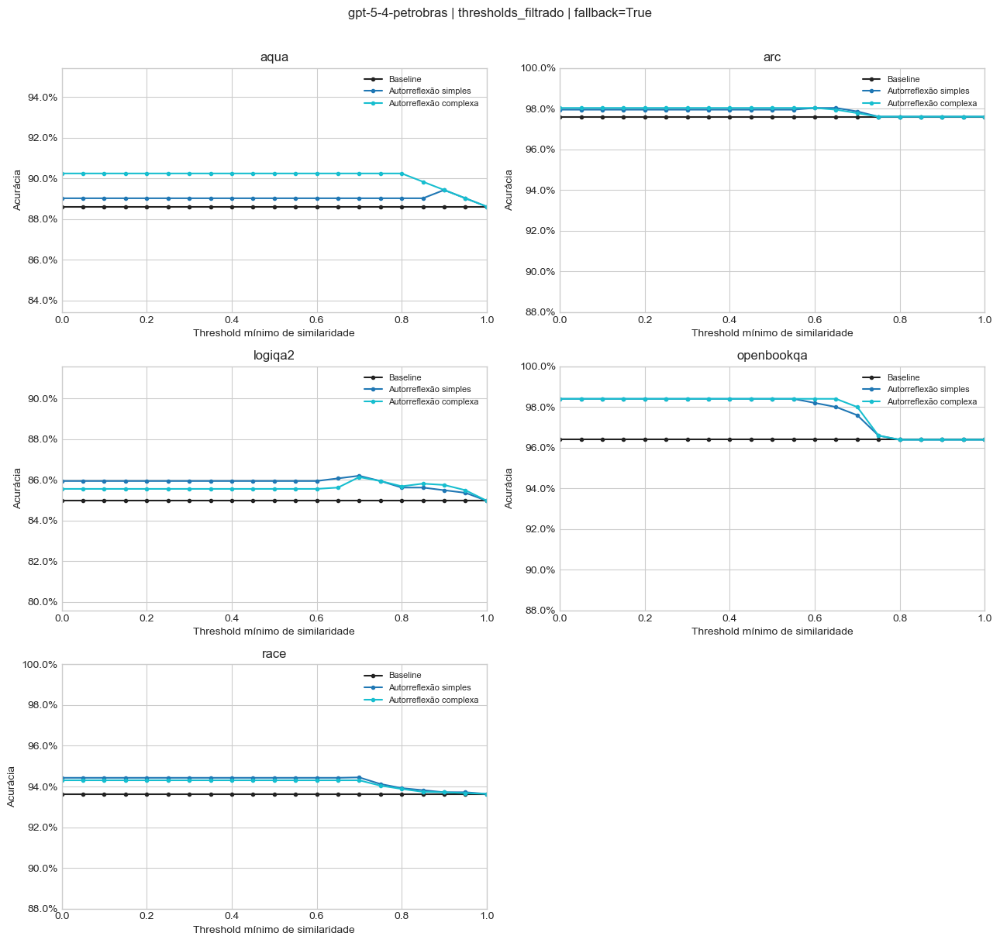

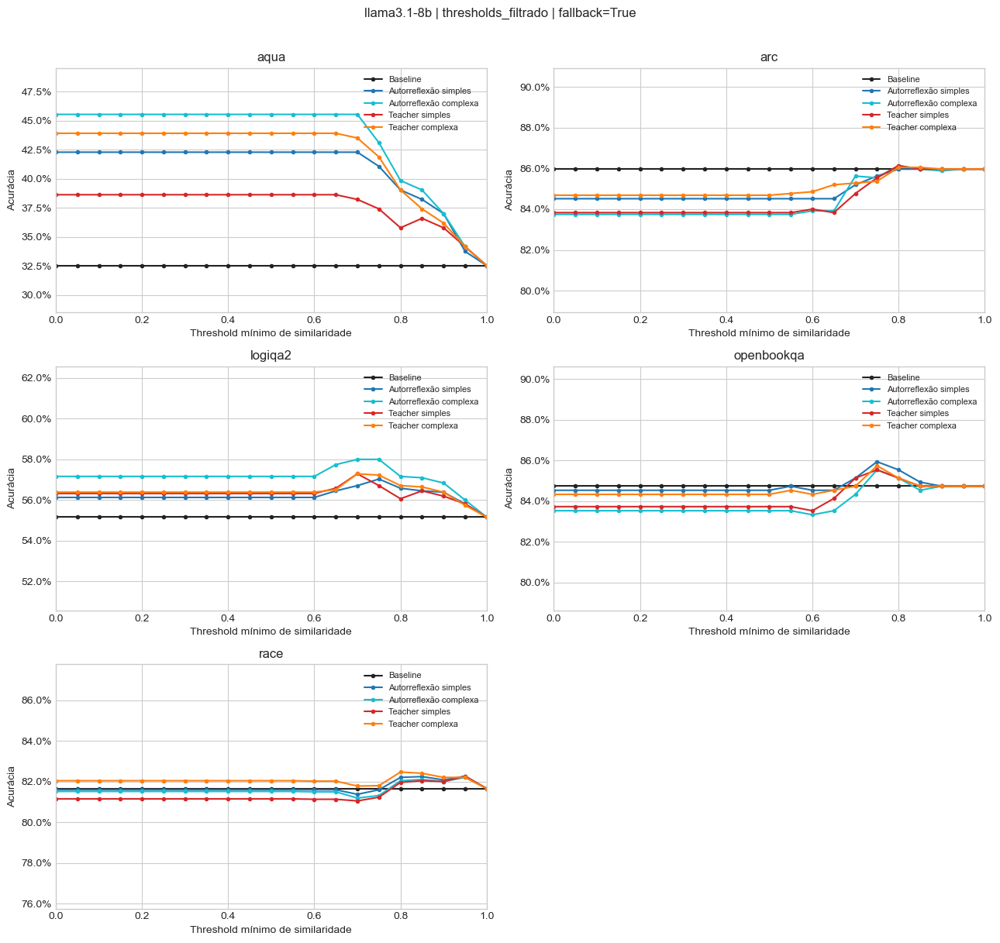

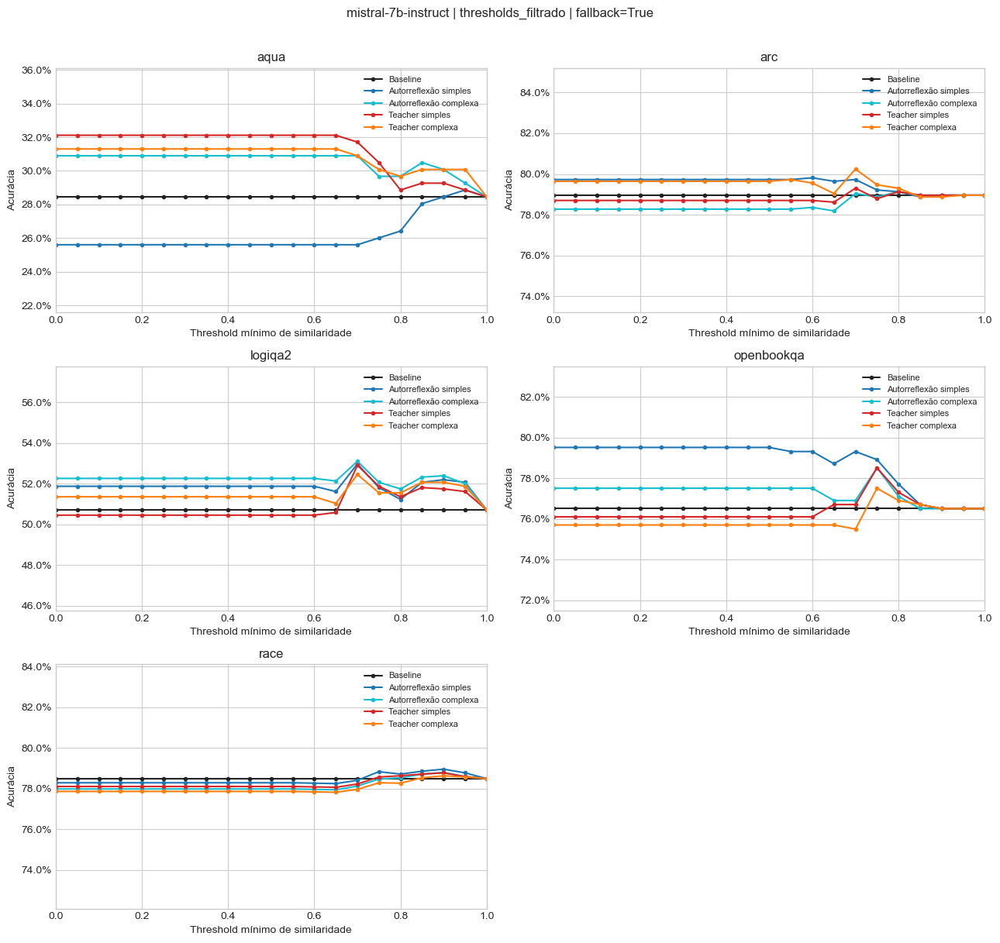

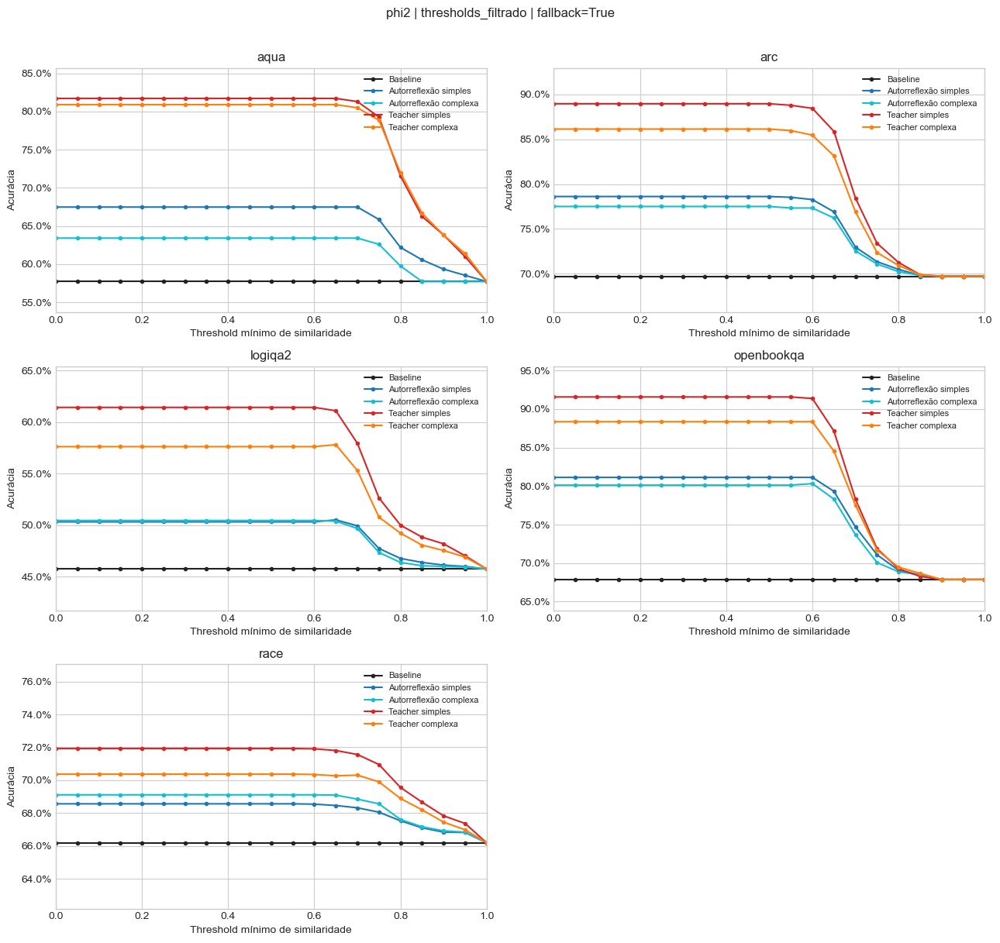

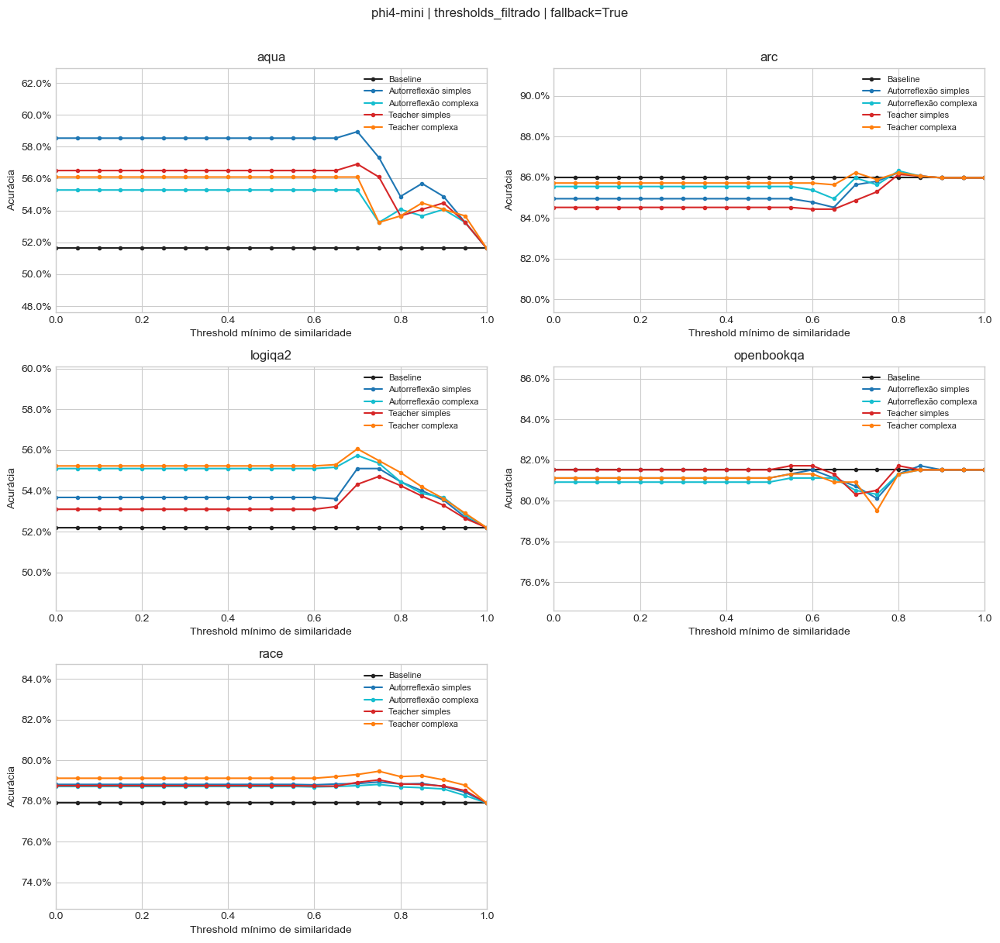

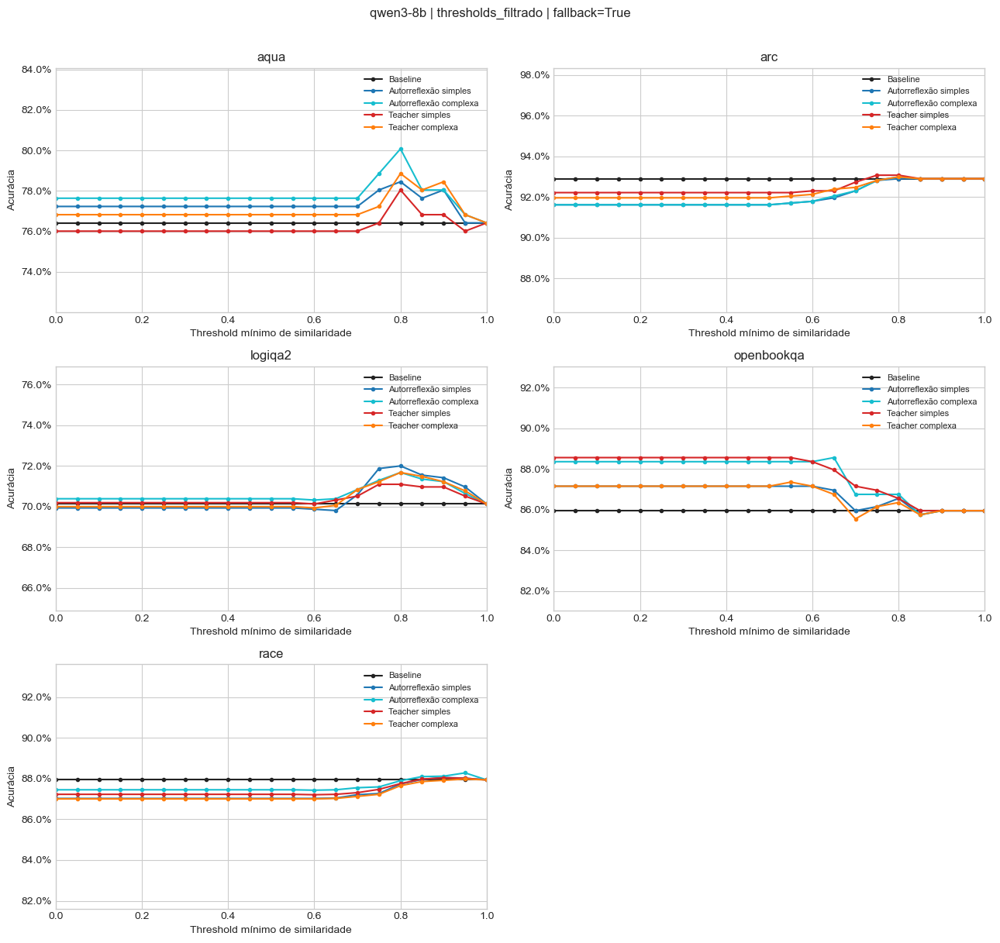

Médias por configuração — filtrado (tabela completa exportada)


,model,condition,threshold,macro_accuracy,correct,n,n_total,n_datasets,n_datasets_scored,n_fallback,micro_accuracy,coverage
0,deepseek-r1-distill-llama-8b,baseline,-1.000000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
11,deepseek-r1-distill-llama-8b,baseline,0.500000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
15,deepseek-r1-distill-llama-8b,baseline,0.700000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
17,deepseek-r1-distill-llama-8b,baseline,0.800000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
19,deepseek-r1-distill-llama-8b,baseline,0.900000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
21,deepseek-r1-distill-llama-8b,baseline,1.000000,81.73%,6816.000000,8397,8397,5,5,0,81.17%,100.00%
22,deepseek-r1-distill-llama-8b,self_complex,-1.000000,83.49%,6969.000000,8397,8397,5,5,1646,82.99%,100.00%
33,deepseek-r1-distill-llama-8b,self_complex,0.500000,83.49%,6969.000000,8397,8397,5,5,1646,82.99%,100.00%
37,deepseek-r1-distill-llama-8b,self_complex,0.700000,83.47%,6966.000000,8397,8397,5,5,3054,82.96%,100.00%
39,deepseek-r1-distill-llama-8b,self_complex,0.800000,83.05%,6927.000000,8397,8397,5,5,6108,82.49%,100.00%


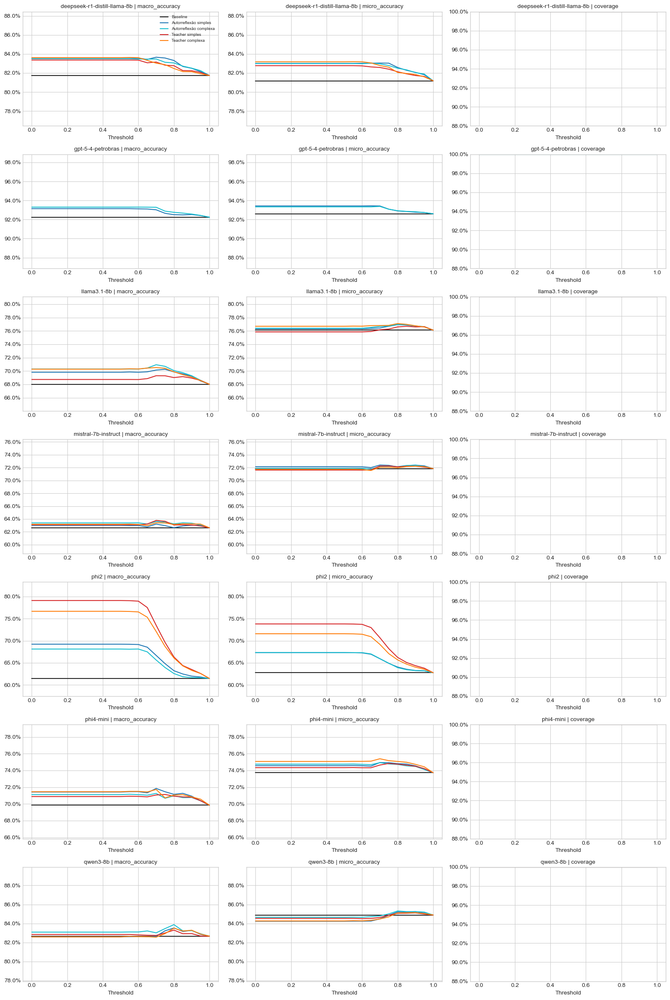

In [8]:
sweeps = {view: threshold_sweep(panel, THRESHOLDS, USE_BASELINE_ON_FAILURE) for view, panel in panels.items()}
macro_tables = {view: average_datasets(sweep) for view, sweep in sweeps.items()}
threshold_limits = pd.concat(sweeps.values(), ignore_index=True)
mean_limits = pd.concat(macro_tables.values(), ignore_index=True)
for view, sweep in sweeps.items():
    sweep.to_csv(OUT / f"thresholds_by_dataset_{view}.csv", index=False)
    averaged = average_datasets(sweep)
    macro_tables[view] = averaged
    averaged.to_csv(OUT / f"thresholds_macro_micro_{view}.csv", index=False)
    plot_by_dataset(sweep, f"thresholds_{view}", "threshold", limit_table=threshold_limits)
    print(f"Médias por configuração — {view} (tabela completa exportada)")
    show_metrics(averaged.loc[averaged.threshold.isin([-1, .5, .7, .8, .9, 1])])
    models = sorted(averaged.model.unique())
    fig, axes = plt.subplots(len(models), 3, figsize=(16, 3.4 * len(models)), squeeze=False)
    for i, model in enumerate(models):
        for j, metric in enumerate(["macro_accuracy", "micro_accuracy", "coverage"]):
            ax = axes[i, j]
            for condition in CONDITIONS:
                curve = averaged.loc[averaged.model.eq(model) & averaged.condition.eq(condition) & averaged.threshold.ge(0)]
                if not curve.empty:
                    ax.plot(curve.threshold, curve[metric], color=COLORS[condition], label=LABELS[condition])
            ax.set_title(f"{model} | {metric}", fontsize=10)
            # Macro e micro usam a mesma escala por modelo nas duas vistas.
            pool = mean_limits.loc[mean_limits.model.eq(model) & mean_limits.threshold.ge(0)]
            values = pool["coverage"] if metric == "coverage" else pool[["macro_accuracy", "micro_accuracy"]].to_numpy().ravel()
            ax.set_ylim(*(accuracy_ylim(values, padding=YLIM_PADDING, min_span=YLIM_MIN_SPAN) if AUTO_YLIM else (0, 1)))
            ax.yaxis.set_major_formatter(PercentFormatter(1))
            ax.set_xlabel("Threshold")
            if i == 0 and j == 0:
                ax.legend(fontsize=7)
    fig.tight_layout()
    save_figure(fig, f"thresholds_medias_{view}")

## 7. Threshold escolhido na validação e aplicado ao teste

Escolhemos separadamente por **modelo × dataset × condição**, maximizando a acurácia de validação com a mesma política de fallback e os mesmos filtros. Só são elegíveis thresholds com `n >= VALIDATION_MIN_N` e cobertura mínima configurada; empates usam o menor threshold. A seleção é refeita para cada vista (completa/filtrada).

Combinações sem validação não recebem threshold estimado. A lista abaixo distingue ausência de validação e falta de amostras elegíveis. O valor selecionado é o melhor na grade avaliada, não um ótimo universal.

**Comparabilidade:** a validação `91ccab5e5028` precede o protocolo final de geração e os ajustes no prompt do teacher. Sua seleção é uma referência histórica transferida ao teste, não uma validação sob protocolo idêntico. Os resultados antigos também têm menos campos de auditoria. Não misturamos runs nem usamos treino como se fosse validação.

O delta no teste compara com o baseline **nas mesmas questões selecionadas**. Assim, com fallback desligado, o delta não confunde o desempenho do baseline no conjunto inteiro com o desempenho da reflexão em um subconjunto.

Cobertura da auditoria detalhada na validação:


,model,dataset,condition,fração_com_auditoria_detalhada
0,gpt-5-4-petrobras,aqua,baseline,0.0
1,gpt-5-4-petrobras,aqua,self_complex,0.0
2,gpt-5-4-petrobras,aqua,self_simple,0.0
3,gpt-5-4-petrobras,arc,baseline,0.0
4,gpt-5-4-petrobras,arc,self_complex,0.0
5,gpt-5-4-petrobras,arc,self_simple,0.0
6,gpt-5-4-petrobras,logiqa2,baseline,0.0
7,gpt-5-4-petrobras,logiqa2,self_complex,0.0
8,gpt-5-4-petrobras,logiqa2,self_simple,0.0
9,gpt-5-4-petrobras,openbookqa,baseline,0.0


Disponibilidade — completo


,model,dataset,condition,status
0,gpt-5-4-petrobras,arc,self_simple,threshold selecionado
1,gpt-5-4-petrobras,logiqa2,self_simple,threshold selecionado
2,gpt-5-4-petrobras,logiqa2,self_complex,threshold selecionado
3,gpt-5-4-petrobras,race,self_simple,sem validação
4,gpt-5-4-petrobras,race,self_complex,sem validação
...,...,...,...,...
125,qwen3-8b,openbookqa,teacher_complex,sem validação
126,qwen3-8b,race,self_simple,sem validação
127,qwen3-8b,race,self_complex,sem validação
128,qwen3-8b,race,teacher_simple,sem validação


Thresholds selecionados na validação


,model,dataset,condition,n_total,n,correct,n_reflection,n_fallback,n_unanswered,n_below_threshold,accuracy,coverage,fallback_rate,threshold,validation_run_id
241,gpt-5-4-petrobras,aqua,self_complex,252,252,222.000000,32,220,0,220,88.10%,100.00%,87.30%,0.950000,91ccab5e5028
242,gpt-5-4-petrobras,aqua,self_simple,252,252,222.000000,32,220,0,220,88.10%,100.00%,87.30%,0.950000,91ccab5e5028
196,gpt-5-4-petrobras,arc,self_complex,298,298,289.000000,66,232,0,232,96.98%,100.00%,77.85%,0.750000,91ccab5e5028
197,gpt-5-4-petrobras,arc,self_simple,298,298,289.000000,66,232,0,232,96.98%,100.00%,77.85%,0.750000,91ccab5e5028
7,gpt-5-4-petrobras,logiqa2,self_complex,1551,1551,1368.000000,1546,5,0,0,88.20%,100.00%,0.32%,-1.000000,91ccab5e5028
8,gpt-5-4-petrobras,logiqa2,self_simple,1551,1551,1373.000000,1541,10,0,0,88.52%,100.00%,0.64%,-1.000000,91ccab5e5028
190,gpt-5-4-petrobras,openbookqa,self_complex,499,499,480.000000,274,225,1,225,96.19%,100.00%,45.09%,0.700000,91ccab5e5028
11,gpt-5-4-petrobras,openbookqa,self_simple,499,499,482.000000,499,0,0,0,96.59%,100.00%,0.00%,-1.000000,91ccab5e5028


Aplicação ao teste


,model,dataset,condition,n_total,n,correct,n_reflection,n_fallback,n_unanswered,n_below_threshold,accuracy,coverage,fallback_rate,threshold,validation_accuracy,validation_n,matched_baseline_accuracy,delta_vs_matched_baseline
0,gpt-5-4-petrobras,aqua,self_complex,246,246,219.000000,36,210,0,210,89.02%,100.00%,85.37%,0.950000,88.10%,252,88.62%,0.41%
1,gpt-5-4-petrobras,aqua,self_simple,246,246,219.000000,36,210,0,210,89.02%,100.00%,85.37%,0.950000,88.10%,252,88.62%,0.41%
2,gpt-5-4-petrobras,arc,self_complex,1169,1169,1141.000000,262,907,0,907,97.60%,100.00%,77.59%,0.750000,96.98%,298,97.60%,0.00%
3,gpt-5-4-petrobras,arc,self_simple,1169,1169,1141.000000,261,908,0,907,97.60%,100.00%,77.67%,0.750000,96.98%,298,97.60%,0.00%
4,gpt-5-4-petrobras,logiqa2,self_complex,1550,1550,1326.000000,1547,3,1,0,85.55%,100.00%,0.19%,-1.000000,88.20%,1551,84.97%,0.58%
5,gpt-5-4-petrobras,logiqa2,self_simple,1550,1550,1332.000000,1541,9,1,0,85.94%,100.00%,0.58%,-1.000000,88.52%,1551,84.97%,0.97%
6,gpt-5-4-petrobras,openbookqa,self_complex,498,498,488.000000,261,237,0,237,97.99%,100.00%,47.59%,0.700000,96.19%,499,96.39%,1.61%
7,gpt-5-4-petrobras,openbookqa,self_simple,498,498,490.000000,498,0,0,0,98.39%,100.00%,0.00%,-1.000000,96.59%,499,96.39%,2.01%


,model,condition,macro_accuracy,correct,n,n_total,n_datasets,n_datasets_scored,n_fallback,micro_accuracy,coverage
0,gpt-5-4-petrobras,self_complex,92.54%,3174.000000,3463,3463,4,4,1357,91.65%,100.00%
1,gpt-5-4-petrobras,self_simple,92.74%,3182.000000,3463,3463,4,4,1127,91.89%,100.00%


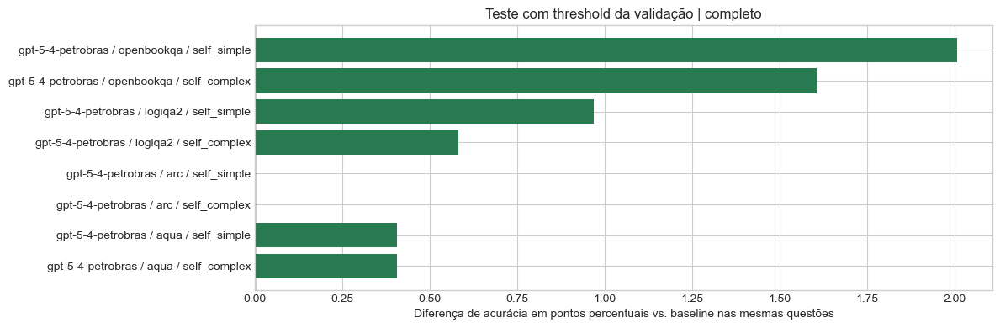

Disponibilidade — filtrado


,model,dataset,condition,status
0,gpt-5-4-petrobras,arc,self_simple,threshold selecionado
1,gpt-5-4-petrobras,logiqa2,self_simple,threshold selecionado
2,gpt-5-4-petrobras,logiqa2,self_complex,threshold selecionado
3,gpt-5-4-petrobras,race,self_simple,sem validação
4,gpt-5-4-petrobras,race,self_complex,sem validação
...,...,...,...,...
125,qwen3-8b,openbookqa,teacher_complex,sem validação
126,qwen3-8b,race,self_simple,sem validação
127,qwen3-8b,race,self_complex,sem validação
128,qwen3-8b,race,teacher_simple,sem validação


Thresholds selecionados na validação


,model,dataset,condition,n_total,n,correct,n_reflection,n_fallback,n_unanswered,n_below_threshold,accuracy,coverage,fallback_rate,threshold,validation_run_id
241,gpt-5-4-petrobras,aqua,self_complex,252,252,222.000000,32,220,0,220,88.10%,100.00%,87.30%,0.950000,91ccab5e5028
242,gpt-5-4-petrobras,aqua,self_simple,252,252,222.000000,32,220,0,220,88.10%,100.00%,87.30%,0.950000,91ccab5e5028
196,gpt-5-4-petrobras,arc,self_complex,298,298,289.000000,66,232,0,232,96.98%,100.00%,77.85%,0.750000,91ccab5e5028
197,gpt-5-4-petrobras,arc,self_simple,298,298,289.000000,66,232,0,232,96.98%,100.00%,77.85%,0.750000,91ccab5e5028
7,gpt-5-4-petrobras,logiqa2,self_complex,1551,1551,1368.000000,1546,5,0,0,88.20%,100.00%,0.32%,-1.000000,91ccab5e5028
8,gpt-5-4-petrobras,logiqa2,self_simple,1551,1551,1373.000000,1541,10,0,0,88.52%,100.00%,0.64%,-1.000000,91ccab5e5028
190,gpt-5-4-petrobras,openbookqa,self_complex,499,499,480.000000,274,225,1,225,96.19%,100.00%,45.09%,0.700000,91ccab5e5028
11,gpt-5-4-petrobras,openbookqa,self_simple,499,499,482.000000,499,0,0,0,96.59%,100.00%,0.00%,-1.000000,91ccab5e5028


Aplicação ao teste


,model,dataset,condition,n_total,n,correct,n_reflection,n_fallback,n_unanswered,n_below_threshold,accuracy,coverage,fallback_rate,threshold,validation_accuracy,validation_n,matched_baseline_accuracy,delta_vs_matched_baseline
0,gpt-5-4-petrobras,aqua,self_complex,246,246,219.000000,36,210,0,210,89.02%,100.00%,85.37%,0.950000,88.10%,252,88.62%,0.41%
1,gpt-5-4-petrobras,aqua,self_simple,246,246,219.000000,36,210,0,210,89.02%,100.00%,85.37%,0.950000,88.10%,252,88.62%,0.41%
2,gpt-5-4-petrobras,arc,self_complex,1169,1169,1141.000000,262,907,0,907,97.60%,100.00%,77.59%,0.750000,96.98%,298,97.60%,0.00%
3,gpt-5-4-petrobras,arc,self_simple,1169,1169,1141.000000,261,908,0,907,97.60%,100.00%,77.67%,0.750000,96.98%,298,97.60%,0.00%
4,gpt-5-4-petrobras,logiqa2,self_complex,1550,1550,1326.000000,1546,4,1,0,85.55%,100.00%,0.26%,-1.000000,88.20%,1551,84.97%,0.58%
5,gpt-5-4-petrobras,logiqa2,self_simple,1550,1550,1332.000000,1540,10,1,0,85.94%,100.00%,0.65%,-1.000000,88.52%,1551,84.97%,0.97%
6,gpt-5-4-petrobras,openbookqa,self_complex,498,498,488.000000,261,237,0,237,97.99%,100.00%,47.59%,0.700000,96.19%,499,96.39%,1.61%
7,gpt-5-4-petrobras,openbookqa,self_simple,498,498,490.000000,498,0,0,0,98.39%,100.00%,0.00%,-1.000000,96.59%,499,96.39%,2.01%


,model,condition,macro_accuracy,correct,n,n_total,n_datasets,n_datasets_scored,n_fallback,micro_accuracy,coverage
0,gpt-5-4-petrobras,self_complex,92.54%,3174.000000,3463,3463,4,4,1358,91.65%,100.00%
1,gpt-5-4-petrobras,self_simple,92.74%,3182.000000,3463,3463,4,4,1128,91.89%,100.00%


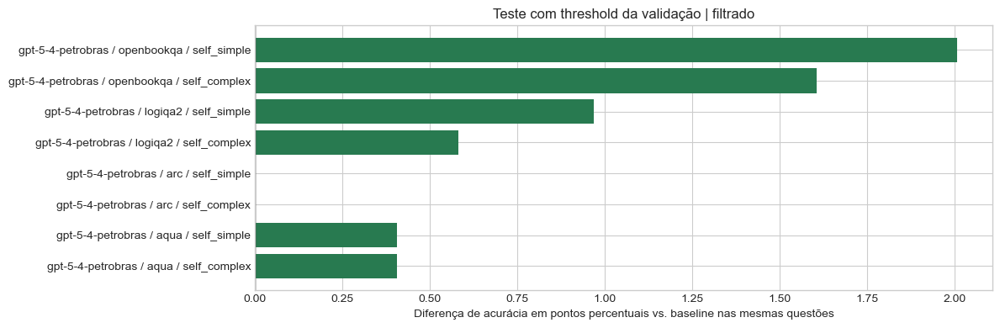

In [9]:
selected_tables, transfer_tables = {}, {}
requested = test.loc[test.condition.ne("baseline"), GROUP].drop_duplicates()
if validation.empty:
    print("Validação indisponível: nenhuma seleção de threshold será feita.")
else:
    print("Cobertura da auditoria detalhada na validação:")
    display(validation.groupby(GROUP).audit_detail_available.mean().rename("fração_com_auditoria_detalhada").reset_index())
    available = validation.loc[validation.condition.ne("baseline"), GROUP].drop_duplicates()
    for view, flags in [("completo", []), ("filtrado", CLEAN_EXCLUDE_FLAGS)]:
        val_panel = build_panel(validation, flags)
        val_sweep = threshold_sweep(val_panel, THRESHOLDS, USE_BASELINE_ON_FAILURE)
        chosen = select_validation_thresholds(val_sweep, VALIDATION_MIN_N, VALIDATION_MIN_COVERAGE)
        chosen["validation_run_id"] = VALIDATION_EXPERIMENT_ID
        selected_tables[view] = chosen
        transferred = transfer_thresholds(panels[view], chosen, USE_BASELINE_ON_FAILURE)
        transfer_tables[view] = transferred
        availability = requested.merge(available.assign(has_validation=True), on=GROUP, how="left")
        availability = availability.merge(chosen[GROUP].assign(selected=True), on=GROUP, how="left")
        availability["status"] = np.where(availability.has_validation.ne(True), "sem validação",
                                          np.where(availability.selected.eq(True), "threshold selecionado", "sem threshold elegível"))
        availability.to_csv(OUT / f"validation_availability_{view}.csv", index=False)
        val_sweep.to_csv(OUT / f"validation_thresholds_{view}.csv", index=False)
        chosen.to_csv(OUT / f"validation_selected_{view}.csv", index=False)
        transferred.to_csv(OUT / f"test_at_validation_threshold_{view}.csv", index=False)
        print(f"Disponibilidade — {view}")
        display(availability[[*GROUP, "status"]])
        print("Thresholds selecionados na validação")
        show_metrics(chosen)
        print("Aplicação ao teste")
        show_metrics(transferred)
        if not transferred.empty:
            show_metrics(average_datasets(transferred.drop(columns="threshold")))
            fig, ax = plt.subplots(figsize=(12, max(4, len(transferred) * .35)))
            labels = transferred[GROUP].agg(" / ".join, axis=1)
            ax.barh(labels, transferred.delta_vs_matched_baseline * 100,
                    color=np.where(transferred.delta_vs_matched_baseline.ge(0), "#287a50", "#b74a48"))
            ax.axvline(0, color="black", lw=1)
            ax.set_xlabel("Diferença de acurácia em pontos percentuais vs. baseline nas mesmas questões")
            ax.set_title(f"Teste com threshold da validação | {view}")
            fig.tight_layout()
            save_figure(fig, f"validation_transfer_{view}")

## 8. Exportações e leitura dos resultados

Use acurácia, número de amostras, cobertura e uso de baseline em conjunto. As tabelas por questão permitem auditar cada substituição: `missing_row`, `flagged`, `below_threshold`, `fallback_used`, `reflection_used`, `unanswered` e `score`.

Não interpretamos as curvas como evidência de significância estatística. A escolha na validação é adaptada ao conjunto de validação; seu desempenho relevante é o observado depois no teste. RACE contém questões que compartilham artigos: eventual inferência estatística deve considerar essa dependência.

Para comparar com e sem fallback, altere a primeira variável e execute novamente. As duas configurações recebem pastas diferentes. Para replicação, mantenha os arquivos de resultados, a revisão do código e os arquivos `config.json` e `sources.json`.

In [10]:
for view, summary in summaries.items():
    summary.to_csv(OUT / f"accuracy_{view}.csv", index=False)
    average_datasets(summary).to_csv(OUT / f"averages_{view}.csv", index=False)
    policies[view][[*GROUP, "val_uid", "similarity", "missing_row", "flagged", "below_threshold",
                    "included", "reflection_used", "fallback_used", "unanswered", "score"]].to_csv(
                        OUT / f"decisions_no_threshold_{view}.csv", index=False)
print(f"Análise concluída. Tabelas e figuras: {OUT}")

Análise concluída. Tabelas e figuras: C:\Users\rodri\OneDrive\Documentos\GitHub\AIIMS\papers\Reflection-MCQ\data\results\reflection_top1\f8009a56a83b\analysis\test_notebook_c9a87f7345
